# Исследование рынка заведений общественного питания города Москва

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

**Цель исследования:** найти интересные особенности рынка мест общественного питания г. Москва, которые смогут помочь инвесторам подыскать подходящее место и более детально проработать бизнес-модель будущего заведения.

**Ход работы:**

- Изучить базу данных, поправить ошибки и недочёты в данных, где это возможно;
- Добавить в таблицу столбцы с дополнительными параметрами, которые помогут выполнить более точный анализ;
- По очищенным данным и при помощи новых столбцов провести анализ рынка заведений общественного питания, а именно:
    - Локации и их насыщенность конкурентами;
    - Факторы, влиющие на ценообразование;
    - Факторы, влиющие на оценку места от посетителей.

## Откроем и изучим файлы с данными

Для этой цели запустим `pandas` и библиотеки с другими инструментами, которые помогут нам провести качественный анализ. Затем откроем файлы, - для карты и с БД, - ознакомимся с общей информацией по датафрейму и его первыми строками, чтобы получить первое представление о том, с чем предстоит работать.

In [140]:
# Импортируем pandas, matplotlib, seaborn, plotly.express и его модуль graph_objects:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
import plotly.io as pio
pio.renderers.default='notebook'
# подключаем модуль для работы с JSON-форматом
import json
# импортируем карту и хороплет
from folium import Map, Choropleth, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

In [141]:
# читаем файл для карты и сохраняем в переменной f
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

# Открываем файл с данными и знакомимся с его содержимым:
data = pd.read_csv('/datasets/moscow_places.csv')
data.info()
data.head(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Таблица корректно загрузилась. Видим в ней следующие столбцы с такой интерпретацией, согласно документации к БД:

- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «*кафе*», «*пиццерия*» или «*кофейня*»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «*средние*», «*ниже среднего*», «*выше среднего*» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например: «*Средний счёт: 1000–1500 ₽*», «*Цена чашки капучино: 130–220 ₽*», «*Цена бокала пива: 400–600 ₽*» и так далее;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «*Средний счёт*»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «*Средний счёт*», то в столбец ничего не войдёт.
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «*Цена одной чашки капучино*»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «*Цена одной чашки капучино*», то в столбец ничего не войдёт.
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    - 0 — заведение не является сетевым
    - 1 — заведение является сетевым
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

Теперь следует провести предобработку:
- Заменить типы данных на более уместные;
- Проверить базу на аномалии и  и поработать с ними, если они обнаружатся;
- Обработать пропуски и дубли.

## Предобработка данных

В плане типов с данными всё нормально. Смущает только столбец с посадочными местами (`seats`) - их определенно не может быть дробное количество.

### Заменим тип данных в столбце `seats`

In [142]:
# Для этого заполним все пропуски нереалистичным числом, а затем поменяем тип на целочисленный:
data['seats'] = data['seats'].fillna('999999').astype('int')
# Проверим, что замена состоялась:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              8406 non-null   int64  
dtypes: float64(5), int64(2), object(7)
memory usage: 919.5+ KB


Замена типа столбца `seats` выполнена. Переходим к обработке пропусков.

### Обработка пропусков

Проверим пропуски в датафрейме методом `isna()`:

In [143]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                   0
dtype: int64

Видим, что пропуски есть в столбцаx:
- `hours` (536 значений или 6.5% датафрейма);
- `price` (5091 или 60.5% датафрейма);
- `avg_bill` (4590 или 54.6% датафрейма);
- `middle_avg_bill` (5257 или 62.5% датафрейма);
- `middle_coffee_cup` (7871 или 94% датафрейма);

В `seats` пропуски тоже были, но здесь они не отображаются, так как мы заменили их на число 999999. 

В остальном, учитывая, что информация в базе была собрана из открытых источников либо добавлена пользователями, логично предположить, что основная причина отсутствия данных - человеческий фактор. Часть данных:
- Могла не быть известной пользователям - некоторые виды данных, такие как информация о часах работы (`hours`), цены (`price`), средний счет (`avg_bill`) и количество посадочных мест (`seats`) определенно требуют визита в заведение. Если такового визита не было, а в интернете информация не была найдена, могли образоваться пустые строки;
- Не заполнялась владельцами бизнеса по субъективным причинам.

Заполняемость столбцов `middle_avg_bill` и `middle_coffee_cup` прямо зависит от конкретных данных в других столбцах. В `middle_avg_bill` ничего не войдет, если в `avg_bill` ничего нет или подстрока не начинается словосочетанием "*Средний счет*". Также, пустыми значениями заполнятся и строки в столбце `middle_coffee_cup`, если в `avg_bill` нет значения или оно не начинается со слов "*Цена одной чашки капучино*". Это объясняет почему в этих столбцах данных меньше всего.

Более-менее достоверно заполнить такое количество пропусков не представляется возможным. Поэтому оставим данные "как есть".

### Обработка дубликатов
Проверим датафрейм на наличие явных дубликатов.

In [144]:
# Для этого вызовем функцию duplicated и применим sum, чтобы получить сумму всех найденных дублей:
data.duplicated().sum()

0

Явных дубликатов нет. Тогда проверим неявные. Такие могут быть прежде всего в категориальных столбцах столбцах `address` и `name` из-за того, что здесь в одном поле могут быть несколько значений, небольшие различия в которых создадут дубли. Для начала проверим `address`, выведя уникальные значения этого поля.

In [145]:
# для этого вызовем unique и применим tolist, чтобы увидеть побольше названий, так как просто unique выдаст очень урезанный
# перечень:
data['address'].unique().tolist()[:20]

['Москва, улица Дыбенко, 7/1',
 'Москва, улица Дыбенко, 36, корп. 1',
 'Москва, Клязьминская улица, 15',
 'Москва, улица Маршала Федоренко, 12',
 'Москва, Правобережная улица, 1Б',
 'Москва, Ижорская улица, вл8Б',
 'Москва, Клязьминская улица, 9, стр. 3',
 'Москва, Дмитровское шоссе, 107, корп. 4',
 'Москва, Ангарская улица, 39',
 'Москва, Левобережная улица, 12',
 'Москва, улица Маршала Федоренко, 10с1',
 'Москва, МКАД, 80-й километр, 1',
 'Москва, Базовская улица, 15, корп. 1',
 'Москва, Ангарская улица, 42с1',
 'Москва, улица Бусиновская Горка, 2',
 'Москва, Базовская улица, 15, корп. 8',
 'Москва, Ленинградское шоссе, 71Б, стр. 2',
 'Москва, Коровинское шоссе, 30А',
 'Москва, Ижорский проезд, 5',
 'Москва, Прибрежный проезд, 7']

Бросается в глаза разность написания строения - "*стр.*" и "*с*", а также корпуса - "*корп.*" и "*к*". Лучше привести их к одному значению. Проще "*стр.*" и "*корп.*" изменить на "*с*" и "*к*" соответственно, чем наоборот - так получится не задеть другие значения:

In [146]:
# Приводим неоднозначные значения к единому написанию через метод replace. Включаем параметр regex=True, чтобы замена сработала:
data['address'] = (
    data['address']
    .replace(', стр. ', 'c', regex=True)
    .replace(' стр. ', 'c', regex=True)
    .replace(', корп. ', 'к', regex=True)
)
# Проверяем изменения:
data['address'].unique().tolist()[:20]

['Москва, улица Дыбенко, 7/1',
 'Москва, улица Дыбенко, 36к1',
 'Москва, Клязьминская улица, 15',
 'Москва, улица Маршала Федоренко, 12',
 'Москва, Правобережная улица, 1Б',
 'Москва, Ижорская улица, вл8Б',
 'Москва, Клязьминская улица, 9c3',
 'Москва, Дмитровское шоссе, 107к4',
 'Москва, Ангарская улица, 39',
 'Москва, Левобережная улица, 12',
 'Москва, улица Маршала Федоренко, 10с1',
 'Москва, МКАД, 80-й километр, 1',
 'Москва, Базовская улица, 15к1',
 'Москва, Ангарская улица, 42с1',
 'Москва, улица Бусиновская Горка, 2',
 'Москва, Базовская улица, 15к8',
 'Москва, Ленинградское шоссе, 71Бc2',
 'Москва, Коровинское шоссе, 30А',
 'Москва, Ижорский проезд, 5',
 'Москва, Прибрежный проезд, 7']

Столбец `address` приведен к единым значениям. Теперь проверим, какие уникальные названия есть в столбце `name`.

In [147]:
# выведем количество уникальных названий, чтобы потом сравнить с тем, что получится после обработки:
print(len(data['name'].unique()))
# вызовем unique и tolist:
data['name'].unique().tolist()

5614


['WoWфли',
 'Четыре комнаты',
 'Хазри',
 'Dormouse Coffee Shop',
 'Иль Марко',
 'Sergio Pizza',
 'Огни города',
 'Mr. Уголёк',
 'Donna Maria',
 'Готика',
 'Great Room Bar',
 'Шашлык Шефф',
 'Заправка',
 'Буханка',
 'У Сильвы',
 'Дом обеда',
 'База Стритфуд',
 'Чайхана Беш-Бармак',
 'Час-Пик',
 'Пекарня',
 'Чебуреки Манты',
 '7/12',
 'Крымские чебуреки',
 'Drive Café',
 'В парке вкуснее',
 'Пикочино',
 'Шаурму Х@чу',
 'Mafe',
 'Кушай Город',
 'Кафедра',
 'Алталия',
 'Додо Пицца',
 'Изба',
 "Домино'с Пицца",
 'Виладж пицца',
 'Пекарня № 1 Грузинская кухня',
 'Халяль закусочная',
 'Ижора',
 'Шаурмагия',
 'Кафе',
 'Крошка Картошка',
 'Варня кафе',
 'Суши & пицца',
 'Кафетерий',
 '9 Bar Coffee',
 'CofeFest',
 'БлинБери',
 '2U-Ту-Ю',
 'Шаурма',
 'Арамье',
 'Cofix',
 'Royal Coffee',
 'Шашлык',
 'Чебуреки и манты',
 'Рыба из тандыра',
 'Мир пиццы',
 "Coffeekaldi's",
 'Хинкали Gали!',
 'Чебуречная история',
 'Кафе Лоза',
 'Пить Есть!',
 'Pizza Hut',
 'Testo мания',
 'Альбатрос',
 'Молинари',
 '

Если внимательно рассмотреть, то становятся заметными на первый взгляд неявные проблемы:
- В названиях "скачет" регистр - например, есть "*Донер Кебаб*" и "*Донер кебаб*". Можем упустить дубли, если не приведем значения к единому регистру;
- Есть много неявных дублей. Например то, что можно назвать одним словом "*кафе*", в датафрейме имеет название "*кафешка*", "*кафетерий*". А "*Кафе-бар*" может быть и "*кафе баром*". Подобные вещи потом затруднят нам анализ.

Имеет смысл привести столбец к единому регистру и поменять обнаруженные дублирущие названия на единый вариант: 

In [148]:
# Через str.lower() приводим данные к одному регистру:
data['name'] = data['name'].str.lower()

# Приводим неоднозначные значения к единому написанию через метод replace. Активируем параметр regex=True, чтобы замена 
# сработала:
data['name'] = (
    data['name']
    .replace('кафетерий', 'кафе', regex=True)
    .replace('кафешка', 'кафе', regex=True)
    .replace('кафе бар', 'кафе-бар', regex=True)
    .replace('чайхона', 'чайхана', regex=True)
    .replace('хинкали gали', 'хинкали-gали', regex=True)
)

# Отдельно меняем кофе на кофейня - метод replace тут не подойдет, так как мы заменим "кофе" везде, в том числе и в уникальных 
# названиях, типа "рожь хлеб и кофе". По той же причине то же самое проделываем с шашлычными:
data.loc[data['name'] == 'кофе', 'name'] = 'кофейня'
data.loc[data['name'] == 'шашлык', 'name'] = 'шашлычная'
data.loc[data['name'] == 'шашлыки', 'name'] = 'шашлычная'
data['name'].unique().tolist() # Проверим, что замена состоялась:

['wowфли',
 'четыре комнаты',
 'хазри',
 'dormouse coffee shop',
 'иль марко',
 'sergio pizza',
 'огни города',
 'mr. уголёк',
 'donna maria',
 'готика',
 'great room bar',
 'шашлык шефф',
 'заправка',
 'буханка',
 'у сильвы',
 'дом обеда',
 'база стритфуд',
 'чайхана беш-бармак',
 'час-пик',
 'пекарня',
 'чебуреки манты',
 '7/12',
 'крымские чебуреки',
 'drive café',
 'в парке вкуснее',
 'пикочино',
 'шаурму х@чу',
 'mafe',
 'кушай город',
 'кафедра',
 'алталия',
 'додо пицца',
 'изба',
 "домино'с пицца",
 'виладж пицца',
 'пекарня № 1 грузинская кухня',
 'халяль закусочная',
 'ижора',
 'шаурмагия',
 'кафе',
 'крошка картошка',
 'варня кафе',
 'суши & пицца',
 '9 bar coffee',
 'cofefest',
 'блинбери',
 '2u-ту-ю',
 'шаурма',
 'арамье',
 'cofix',
 'royal coffee',
 'шашлычная',
 'чебуреки и манты',
 'рыба из тандыра',
 'мир пиццы',
 "coffeekaldi's",
 'хинкали-gали!',
 'чебуречная история',
 'кафе лоза',
 'пить есть!',
 'pizza hut',
 'testo мания',
 'альбатрос',
 'молинари',
 'штаб кварти

Теперь поищем, найдутся ли в таблице совпадения по адресу и имени - вряд ли два ресторана с идентичным названием могут находится в одном месте, даже если это сеть:

In [149]:
# Ищем дубликаты через два столбца. Также, в параметре keep проставим False, чтобы увидеть все дубли:
data[data.duplicated(subset=['address', 'name'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11c2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11c2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276


Видим, что несколько дубликатов действительно сюда затесались. Удалим их. Но при удалении будем учитывать, что все заведения выше относятся к сетям, а значит разумнее оставить строки, где это отражено:

In [150]:
data.drop(labels = [1430, 2211, 3109], axis = 0, inplace = True)
# перезагрузим индекс после удаления строк:
data.reset_index()

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,999999
1,1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36к1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4
2,2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45
3,3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,999999
4,4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8398,8401,суши мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86
8399,8402,миславнес,кафе,"Москва, Пролетарский проспект, 19к1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150
8400,8403,самовар,кафе,"Москва, Люблинская улица, 112Аc1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150
8401,8404,чайхана sabr,кафе,"Москва, Люблинская улица, 112Аc1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150


Теперь поищем дубли через категорию, ширину и долготу - поскольку в категориальных значениях таких, как имя и адрес, часто встречается много значений сразу, возможны ошибки в записях и разное написание, что не даст нам увидеть дубли. Тогда как категория, ширина и долгота едины в написании:

In [151]:
# Ищем дубликаты через три столбца. Также, в параметре keep проставим False, чтобы увидеть все дубли, отсортируем полученные
# данные по широте:
data[data.duplicated(subset=['category', 'lng', 'lat'], keep=False)].sort_values(by='lat')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
7407,старый дворик,кафе,"Москва, улица Нижние Поля, 19Бc1",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.658424,37.737291,4.1,средние,Средний счёт:от 300 ₽,300.0,NaN,1,45
7362,хинкальная,кафе,"Москва, улица Нижние Поля, 19Бc1",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.658424,37.737291,4.3,средние,Средний счёт:от 300 ₽,300.0,NaN,1,45
6549,bổ,кафе,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 11:00...",55.661638,37.480148,4.7,NaN,NaN,NaN,NaN,0,999999
6534,fibo pasta & ravioli,кафе,"Москва, проспект Вернадского, 86В",Западный административный округ,пн-сб 10:00–22:00; вс 11:00–22:00,55.661638,37.480148,4.8,средние,Средний счёт:500–1000 ₽,750.0,NaN,1,999999
6807,loft-cafe академия,кафе,"Москва, проспект Вернадского, 84c1",Западный административный округ,пн-пт 09:00–20:00; сб 09:00–16:00,55.665142,37.478603,3.6,NaN,NaN,NaN,NaN,0,1288
6762,campus,кафе,"Москва, проспект Вернадского, 84с1",Западный административный округ,пн-пт 08:30–20:00; сб 08:30–17:00,55.665142,37.478603,2.8,NaN,NaN,NaN,NaN,1,999999
8401,суши мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86
7066,кофейня,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 10:00–21:00",55.670021,37.552480,5.0,NaN,NaN,NaN,NaN,1,86
6278,восточная кухня,кафе,"Москва, Ленинский проспект, 65к2",Юго-Западный административный округ,NaN,55.692059,37.557188,3.8,NaN,NaN,NaN,NaN,1,144
6204,эдельвейс,кафе,"Москва, Ленинский проспект, 65к3",Юго-Западный административный округ,NaN,55.692059,37.557188,2.9,NaN,NaN,NaN,NaN,0,45


Видим, что дубли есть и тут. Но не все. Определенно дубли:
- *leon* и *леон* - идентичны, только название написано одно через латиницу, другое - через кириллицу;
- *чайхана doner кафе* и *чайхана döner* - тоже различие лишь в названии и неизвестности посадочных мест у 2-го варианта;
- *кафе-кулинария сикварули* и *сикварули* - один ресторан с приставкой "*кафе-кулинария*", а другой - без.

Удалим их через метод `drop`, передав ему индексы ресторанов, которые мы хотим удалить и проставив `inplace = True`, чтобы измения отразились на датафрейме:

In [152]:
# индексы для удаления выбраны для тех дублей, чьи строки содержат меньше информации:
data.drop(labels = [5316, 1324, 2841], axis = 0, inplace = True)
# перезагрузим индекс после удаления строк:
data.reset_index()
# выведем количество уникальных имен ресторанов, чтобы сравнить с тем, что было изначально:
print(len(data['name'].unique()))

5494


Удалось избавиться от более чем 100 неявных дубликатов в столбце `name`.

### Создание новых столбцов

Чтобы детально проанализировать датафрейм нам понадобится пара дополнительных столбцов. Мы создадим:
- столбец `street` с названиями улиц из столбца с адресом;
- столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
    - Где *True* — если заведение работает ежедневно и круглосуточно;
    - И *False* — в противоположном случае.

#### Cтолбец `street` с названиями улиц
Используем `str.split`, чтобы вытащить нужные нам значения из `street`:

In [153]:
data['street'] = data['address'].str.split(', ').str[1]

#### Столбец `24/7` для круглосуточных заведений
Посмотрим уникальные значения `hours`:

In [154]:
data['hours'].unique().tolist()[:20]

['ежедневно, 10:00–22:00',
 'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
 'ежедневно, 09:00–22:00',
 'ежедневно, 10:00–23:00',
 'пн 15:00–04:00; вт-вс 15:00–05:00',
 'пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00',
 'ежедневно, 12:00–00:00',
 'ежедневно, круглосуточно',
 'ежедневно, 10:00–21:00',
 'вт-сб 09:00–18:00',
 'ежедневно, 08:00–22:00',
 'ежедневно, 13:00–00:00',
 'пн-пт 08:30–18:30; сб 10:00–20:00',
 'ежедневно, 09:00–21:00',
 'пн-пт 09:00–21:00',
 'пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00–22:00',
 'пн-пт 08:00–22:00; сб,вс 10:00–22:00',
 'ежедневно, 10:00–19:00',
 'пн-пт 09:00–16:00',
 'ежедневно, 08:00–21:00']

Много какие заведения работают ежедневно, но единственное значение, которое отражает работу 24/7 - фраза "*ежедневно, круглосуточно*".

Используем `str.contains`, чтобы вытащить нужные нам значения из hours: метод присвоит *True* всем заведениям, где в `hours` встречается "*ежедневно, круглосуточно*" и *False* тем заведениям, где фраза отличается:

In [155]:
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')

# проверим, что столбцы добавились:
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,999999,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36к1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,999999,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148,Правобережная улица,False


Предобработка завершена. 

- Изменен тип столбца `seats`; 
- Проведен анализ причин наличия пропусков; 
- Выполнен поиск и коррекция дублей; 
- К датафрейму добавлены новые столбцы.

## Проведем анализ данных

### Изучим по каким категориям распределяются заведения из датафрейма

Для этого подготовим данные - создадим отдельную табличку, где будут посчитаны все категории, представленные в датафрейме **data**. Для этого объявим имя новой таблицы (**data_cat**), затем сгруппируем данные по столбцу `category` и проведем именнованную агрегацию. После подготовки данных построим круговую диаграмму, которая даст нам представление о распределении.

In [156]:
data_cat = data.groupby('category', as_index = False).agg(count=('category', 'count')).sort_values(by='count', ascending=False)

# Теперь, когда нужные нам данные удобно выделены по столбцам, построим круговую диагарамму, которая наглядно покажет нам 
# распределение заведений по категориям. В параметры диаграммы передадим названия категорий и количество заведений, цветовую 
# палитру, а при помощи параметра pull достанем самый крупный сегмент для наглядности:
fig = go.Figure(data=[go.Pie(labels=data_cat['category'], values=data_cat['count'], 
                             pull=[0.1, 0], marker_colors=px.colors.qualitative.Set3)])

# Настроим отображение заголовка, легенды и данных на круговой диаграмме.:
fig.update_layout(
    font={'size': 15},
    title={'text': '<b>Как распределяются заведения общепита в Москве по категориям</b>', 'font': {'size': 20}}
)
# Выводим результат на экран:
fig.show()

Видим, что наибольшую долю занимают **кафе** - в датафрейме 28,3% заведений имеют именно такой тип. Далее со сравнительно небольшим отставанием следуют **рестораны** - их доля 24.3%. На третьем месте **кофейни** - их доля 16.8%. Долю меньше 10% занимают заведения с типом **"Бар, паб"** (9,1%), **"Пиццерия"**(7,54%), **"Быстрое питание"**(7,18%), **"Столовая"**(3,75%), **"Булочная"**(3,05%). 

### Изучим количество посадочных мест в местах по категориям

Для начала воспользуемся `describe`, чтобы посмотреть как лучше проводить вычисления:

In [157]:
data.query('seats != 999999')['seats'].describe()

count    4791.000000
mean      108.381966
std       122.845730
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

Видим, что разлет между количеством посадочных мест весьма значительный. Среднее (mean) больше медианы (50%) примерно на треть. Лучше использовать медиану в расчетах, чтобы выбросы, как в максимальном значении посадочных мест (1288 - явно редкая история в заведениях общепита) не влияли на анализ.

Теперь подготовим данные. Объявим имя новой таблицы (**data_chair**), исключим из анализа добавленные нами же значения "*seats=999999*". Затем сгруппируем данные по столбцу `category` и проведем именнованную агрегацию, после чего отсортируем значения по убыванию:

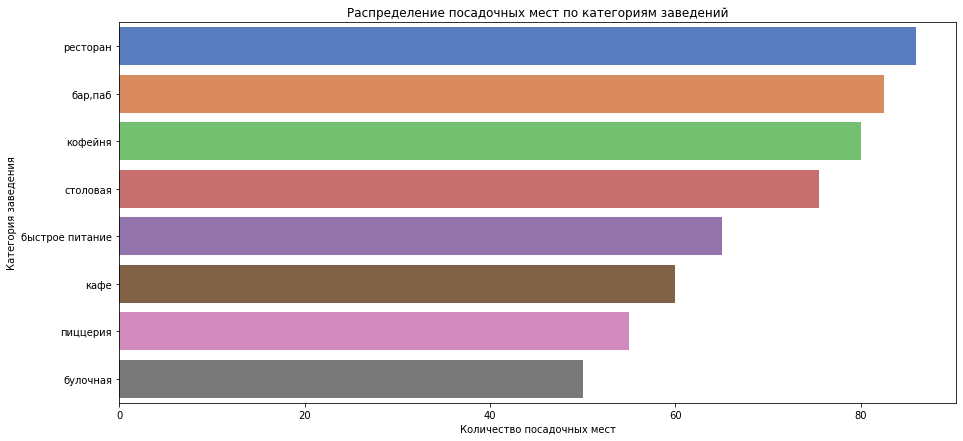

In [158]:
data_chair = (
    data
    .query('seats != 999999')
    .groupby('category', as_index=False)
    .agg(median_seats=('seats', 'median'))
    .sort_values(by='median_seats', ascending=False)
)

# По этой табличке строим столбчатую диаграмму, которая покажет нам распределение посадочных мест по типам заведений:
sns.set_palette('muted')
plt.figure(figsize=(15, 7))
ax = sns.barplot(x='median_seats', y='category', data=data_chair)
ax.set(xlabel='Количество посадочных мест', ylabel='Категория заведения', 
       title="Распределение посадочных мест по категориям заведений")
plt.show()

Видим, что **рестораны**, лидируют по количеству посадочных мест. На втором месте **Бары, пабы**. Замыкают первую тройку  **кофейни**, от которых не намного отстают **столовые** (4 место). Все эти заведения имеют 75+ мест.

Категории **быстрое питание**, **кафе** и **пиццерии** имеют медианное значение в примерно 55-65 посадочных мест. Меньше всего мест (порядка 50) в **булочных**.

### Изучим соотношение сетевых и несетевых заведений в датасете

Подготовим данные, сгруппировав их по столбцу `chain` и посчитав заведения каждого типа при помощи `count`. Переименуем образовавшиеся столбцы.

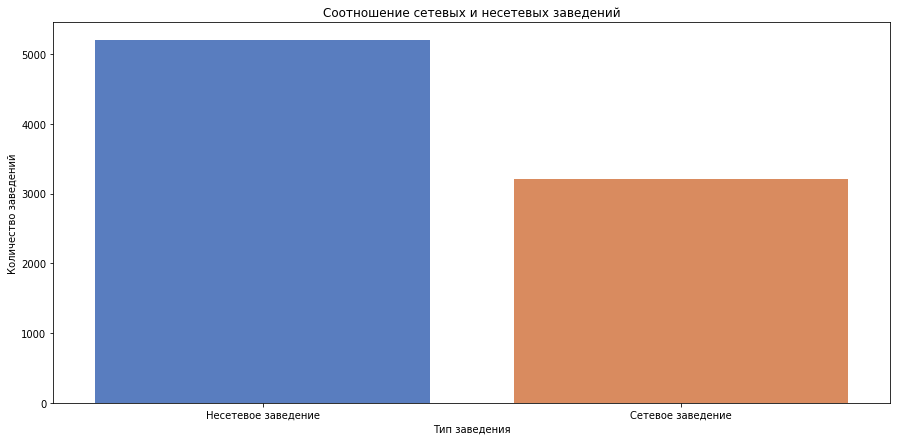

In [159]:
data_chain = (
    data
    .groupby('chain')
    .agg(count=('chain', 'count'))
    .rename(index={0: 'Несетевое заведение', 1: 'Сетевое заведение'})
    .reset_index() # сбросим индекс, чтобы переименование сработало
)

# Строим столбчатую диаграмму по подготовленным данным:
plt.figure(figsize=(15, 7))
ax = sns.barplot(x='chain', y='count', data=data_chain)
ax.set(xlabel='Тип заведения', ylabel='Количество заведений', title="Cоотношение сетевых и несетевых заведений")
plt.show()

Видим, что несетевых заведений почти в 2 раза больше, чем сетевых. 

### Выясним, какие именно категории заведений чаще являются сетевыми

Подготовим данные, сгруппировав их уже не только по столбцу `chain`, но и по `category`. Посчитаем заведения каждого типа (сеть/не сеть) по категориям при помощи `count`.

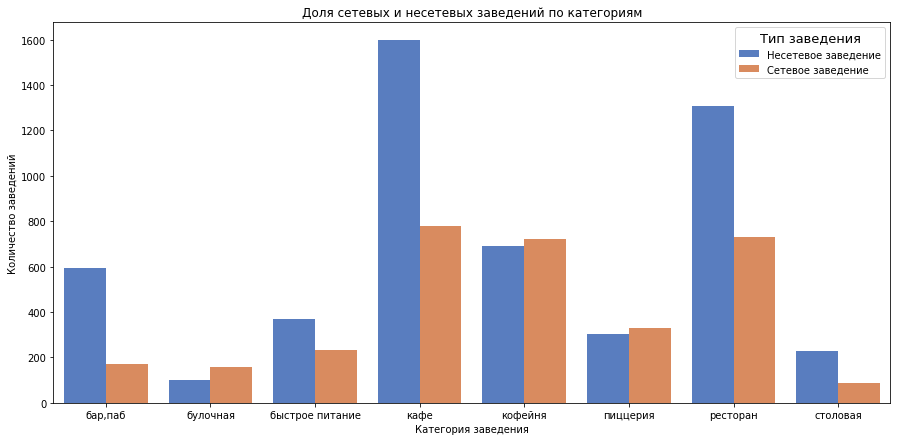

In [160]:
data_chain2 = (
    data
    .groupby(['category', 'chain'])
    .agg(count=('chain', 'count'))
    .rename(index={0: 'Несетевое заведение', 1: 'Сетевое заведение'})
    .reset_index()
)
# Строим столбчатую диаграмму по подготовленным данным, но теперь добавляем третьем измерение (chain) через параметр hue:
plt.figure(figsize=(15, 7))
ax = sns.barplot(x='category', y='count', hue='chain', data=data_chain2)
ax.set(xlabel='Категория заведения', ylabel='Количество заведений', title='Доля сетевых и несетевых заведений по категориям')
ax.legend(title="Тип заведения", title_fontsize = 13)
plt.show()

Несетевых заведений примерно в 2-2,5 раза больше в категориях ***кафе***, ***ресторан***, ***бар,паб***, ***столовая***, ***быстрое питание***, чем сетевых.

В то же время, в категориях ***булочная***, ***кофейня*** и ***пиццерия*** со сравнительно небольшим отрывом лидируют сетевые заведения. 

Возможно, это связано с тем, что в категориях булочная, кофейня и пиццерия меню достаточно ограничено, с рецептурой и уникальными предложениями особо не разбежишься. Это может усложнять конкуренцию, так как трудно создать что-то уникальное и быть замеченным потребителем. В таком случае владельцы бизнеса могут посчитать, что проще не "изобретать велосипед", а выбирать испытанные франшизы и открывать заведения по ним. 

А вот кафе, рестораны, бары, столовые и заведения быстрого питания не ограничены отдельными товарами, могут предлагать разные национальные кухни с любыми вариациями и комбинировать их между собой, выделяясь среди конкурентов.

### Проанализируем, какие сетевые заведения в Москве образуют топ-15 по популярости

Подготовим данные, заведя новую табличку **top_name**, в которой оставим только те заведения, что являются сетевыми. Сгруппируем данные по названию (столбец `name`), после чего посчитаем количество этих названий при помощи `count`. Отсортируем значения по убыванию и ограничим выдачу первыми 15-ью значениями.

In [161]:
top_name = (
    data
    .query('chain == 1')
    .groupby('name', as_index=False)
    .agg(count=('name', 'count'))
    .sort_values(by='count', ascending=False)[:15]
)

#Построим круговую диаграмму, которая наглядно покажет нам топ-15 заведений и их количество. В параметры диаграммы передадим 
# названия и количество заведений, цветовую палитру, а при помощи pull достанем самый крупный сегмент для наглядности:
fig = go.Figure(data=[go.Pie(labels=top_name['name'], values=top_name['count'], 
                             pull=[0.1, 0], marker_colors=px.colors.qualitative.Set3)])

# Настроим отображение заголовка, легенды и данных на круговой диаграмме:
fig.update_layout(
    font={'size': 13},
    title={'text': '<b>Топ-15 популярных сетей в Москве</b>', 'font': {'size': 20}}
)

# Выведем на экран и количество заведений, и их % долю в топ-15:
fig.update_traces(textinfo='percent+value')

# Выводим диаграмму на экран:
fig.show()

Все заведения в топ-15 популярности объединяет то, что их много - у каждого бренда не менее 25 точек (27, если быть точнее, у "Му-му", имеющего самую маленькую долю в топе).

В ТОП-15 с весомым отрывом лидирует одна из самых известных сетей кофеен - "Шоколадница". Также, крупные доли имеют две сети пиццерий - "Домино'с пицца"(2 место) и "Додо пицца"(3 место). Эти сети известны не только в Москве, но и по всей России и за её пределами (преимущественно в СНГ). Так что их лидерство неудивительно.

### Выясним, какие категории заведений представляет наш топ-15
Для этого подготовим данные. Отфильтруем ранее созданную нами табличку **top_name** так, чтобы в ней остались только уникальные названия 15 самых популярных заведений. Полученные значения поместим в **top_chain**. Затем отсортируем исходный датафрейм так, чтобы в нем остались только сетевые заведения с такими названиями, которые есть в **top_chain**. Из этих данных уже можно группировать нужные нам столбцы (`name` и `category`) и выяснять в какой сети сколько заведений и к какой категории они относятся.

In [162]:
top_chain = top_name['name'].unique()
chain_filtered = data.query('chain == 1').query('name in @top_chain')

biggest_chain = (
    chain_filtered
    .groupby(['name', 'category'], as_index=False)
    .agg(count=('name', 'count'))
)

# Строим столбчатую диаграмму. Третьим измерением (color) выступит category. Прописываем в параметрах размеры, палитру, 
# ориентацию и то, что на графике, где это возможно, будет отображаться количество заведений определенной категории 
# (text='count'):
fig = px.bar(biggest_chain, x='count', y='name', color='category', 
             title='Распределение заведений по категориям из топ-15 сетей', orientation = 'h', text='count',
            width=980, height=600, color_discrete_sequence=px.colors.qualitative.Set3)
# Прописываем названия осей и легенды, а также то, как отображается текст:
fig.update_layout(yaxis={'categoryorder':'total ascending'}, xaxis_title="Количество заведений", 
                  yaxis_title="Название сети", legend_title='Категория', uniformtext_minsize=10, uniformtext_mode='hide')
fig.update_traces(textposition='inside', width=0.9)
fig.show() # выводим на экран

Примечательно то, что даже заведения одних сетей могут различаться по категориям. Это может быть связано как с ошибками при внесении информации в базу данных, так и с тем, что какие-то заведения сети могут иметь больший и более разнообразный ассортимент, какие-то - меньший, что и приводит к различию в категориях.

### Изучим, как категории заведений из топ-15 по популярности распределяются по районам

Снова используем отфильрованные данные из **chain_filtered**, но теперь сгруппируем столбцы **category** и **district**. При помощи агрегации с `count` посчитаем количество для каждой категории в каждом районе и отсортируем полученные данные по убыванию для более упорядочненого отображения.

In [163]:
biggest_chain2 = (
    chain_filtered
    .groupby(['category', 'district'], as_index=False)
    .agg(count=('category', 'count'))
    .sort_values(by='count', ascending=False)
)
# Строим столбачутую диаграмму, передавая ей название осей и параметры размера, ориентации, палитры, а также текст легенды и 
# подписей:
fig = px.bar(biggest_chain2, x='district', y='count', color='category', text='count', orientation = 'v', width=950, height=600, 
             color_discrete_sequence=px.colors.qualitative.Set3, 
             title='Распределение заведений каждой категории по районам (топ-15 по популярности)', labels={
                     "district": "Округ Москвы",
                     "count": "Количество",
                     "category": "Категория"
                 })

# устанавливаем мин. размер для текста, учитывая который надписи могут скрываться, если не помещаются:
fig.update_layout(uniformtext_minsize=10, uniformtext_mode='hide')

fig.show()

Видим, что первая тройка категорий сетевых заведений в ЦАО, - ***кофейня***, ***ресторан***, ***кафе***, - отличается почти от всей остальной Москвы. Везде, кроме ЦАО и ЮВАО, вместо ***кафе*** в топ-3 категорий входят ***пиццерии***.
Остальные категории представлены в районах единичными заведениями (буквально 1-2 организации). Немного выбиваются только ***булочные*** - в ЗАО, САО и СВАО наблюдается некоторое скопление заведений этой категории из топ-15 по популярности.

### Изучим общее количество заведений и то, как их категории распределяются по районам Москвы

Для этого сгруппируем изначальный датафрейм по столбцам `category` и `district`. При помощи агрегации с `count` посчитаем количество для каждой категории в каждом районе.

In [164]:
data_district = (
    data
    .groupby(['category', 'district'], as_index=False)
    .agg(count=('category', 'count'))
)

# Строим столбачутую диаграмму, передавая ей название осей и параметры размера, ориентации, палитры, а также текст легенды и 
# подписей:
fig = px.bar(data_district, x='count', y='district', color='category', 
             title='Количество заведений каждой категории по районам', orientation = 'h',
            width=980, height=600, color_discrete_sequence=px.colors.qualitative.Set3)
fig.update_layout(yaxis={'categoryorder':'total ascending'}, xaxis_title="Количество заведений", 
                  yaxis_title="Район города", legend_title='Категория')
fig.show()

Однозначный лидер по количеству заведений и по количеству категорий - ЦАО. В центре сосредоточено более 2500 тыс. заведений датафрейма. Все другие районы имеют общее количество заведений намного меньше - < 1000.

В САО, ЮАО, СВАО и ЗАО примерно одинаковое количество заведений - в пределах примерно 800-900. Далее, начиная с ВАО, количество заведений начинает снижаться, однако нигде не падает ниже 700, кроме СЗАО, где общее количество заведений не достигает даже 500. 

В плане категорий везде лидируют ***рестораны*** и ***кафе***. Также к первой тройке категорий можно отнести ***кофейни***. В ЦАО выделяется большое количество ***баров,пабов***, однако в других районах их намного меньше. Примечательно, что при такой насыщенности центра барами заведений этого типа из топ-15 по популярности в ЦАО совсем мало (всего 2, что видно на предыдущем графике). 

Категории распределяются достаточно равномерно. Везде видим плюс-минус одинаковое количество (относительно общего количества на район) заведений типа ***быстрого питания***, ***булочных***, ***столовых***, ***пиццерий***.

### Средние рейтинги у разных категорий заведений

Для начала посмотрим, что нам скажет про разброс значений `describe` - если разлет между медианой и средним арифметическим будет чрезмерный, лучше взять медиану.

In [165]:
data['rating'].describe()

count    8400.000000
mean        4.229881
std         0.470496
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

Видим, что стандартное отклонение довольно мало и разница между медианой и средним арифметическим тоже - значит резких выбросов в этом столбце нет и мы можем воспользоваться средним арифметическим.

Сначала подготовим данные. Группируем изначальный датафрейм по столбцу `category`. При помощи агрегации с `mean` посчитаем средний рейтинг заведений каждой категории.

In [166]:
cat_rating = (
    data
    .groupby('category', as_index=False)
    .agg(mean_rate=('rating', 'mean')).round(2)
)

# Строим столбачутую диаграмму, передавая ей название осей и параметры размера, ориентации, палитры, а также текст легенды и 
# подписей:
fig = px.bar(cat_rating, x='category', y='mean_rate', color='mean_rate',
             title='Средний рейтинг по категориям заведений', labels={
                     "category": "Категория заведения",
                     "mean_rate": "Средний рейтинг",
                     "mean_rate": "Средний рейтинг"
                 },orientation = 'v', width=980, height=500, color_continuous_scale='ylgn')

fig.update_layout(xaxis={'categoryorder':'total descending'}) # прописываем выведение значений по убыванию

fig.show()

Средние рейтинги различаются не сильно - в зависимости от категории заведения варьируются от значений от 4 до 4,5. Самый высокий рейтинг получают ***бар,паб*** - 4,39. ***Пиццерия***, ***ресторан***, ***кофейня*** и ***булочная*** находятся на примерно одном уровне - рейтинг от 4.3 до 4,27. Ниже всего рейтинг у ***столовых*** (4,21), ***кафе*** (4,12) и ***быстрого питания*** (4,05).

### Изучим средний рейтинг заведений в районе на карте Москвы

Для этого при помощи хороплета построим карту Москвы и отобразим на ней средний рейтинг заведений каждого района.
Подготовим данные для карты: сгруппируем данные по районам и рассчитаем средний рейтинг, который затем округлим до 2 значений после запятой. А после этого создадим хороплет.

In [167]:
rating_rest =data.groupby('district', as_index=False)['rating'].agg('mean').round(2)

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

# передаем в переменные геоданные: moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_rest,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Видим, что наибольший рейтинг имеют заведения в центре Москвы (ЦАО). Также довольно хорошие оценки получают заведения из САО и СЗАО. Самый низкий рейтинг имеют заведения в ЮВАО.

### Выведем все заведения датасета на карту с помощью кластеров

In [168]:
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма, создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Видим, что большое количество заведений (около 3000) сконцентрировано в центре и вокруг него. Нигде больше в Москве такой концентрации не наблюдается. Остальные районы имеют сопоставимое количество заведений, но чем дальше от центра, тем концентрированность заведений ниже. Убыль особенно заметна в южных районах.

### Изучим примерную стоимость заказа в рублях для каждого района

Для этого посчитаем медианную стоимость заказа.

In [169]:
district_price = data.groupby('district')['middle_avg_bill'].agg('median')
district_price

district
Восточный административный округ            575.0
Западный административный округ            1000.0
Северный административный округ             650.0
Северо-Восточный административный округ     500.0
Северо-Западный административный округ      700.0
Центральный административный округ         1000.0
Юго-Восточный административный округ        450.0
Юго-Западный административный округ         600.0
Южный административный округ                500.0
Name: middle_avg_bill, dtype: float64

А теперь используем табличку с вычисленной районной медианой стоимости как основу для хороплета, который наглядно покажет нам ценовой характер каждого района.

In [170]:
# создадим новую карту:
map_msk = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту:
Choropleth(
    geo_data=state_geo,
    data=district_price,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    legend_name='Примерная стоимость заказа в рублях по районам Москвы',
).add_to(map_msk)

# выводим карту
map_msk

Видим, что самый дорогой по медиане - ЦАО. Но ему не уступает ЗАО.
Вторые по дороговизне СЗАО и САО. ВАО и ЮЗАО ненамного, но дешевле их. Самые бюджетные - ЮАО, ЮВАО и СВАО.

#### Проведем анализ топ-15 улиц по количеству заведений

Для этого построим график распределения количества заведений и их категорий по этим улицам.

In [171]:
# Для графика потребуется провести подготовку. Сначала находим топ-15 улиц по количеству заведений:
streets = (
    data
    .groupby('street', as_index=False)
    .agg(count=('name', 'count'))
    .sort_values(by='count', ascending=False)[:15]
)

# В переменную top_streets загоняем уникальные названия улиц:
top_streets = streets['street'].unique()

# фильтруем датафрейм так, чтобы в нем остались только названия улиц из top_streets:
streets_filtered = data.query('street in @top_streets')

# По отфильтрованному датафрейму группируем улицы и категории, считаем заведения каждой категории на каждой улице:
streets_15 = (
    streets_filtered
    .groupby(['street', 'category'], as_index=False)
    .agg(count=('category', 'count'))
)

# Создаем сам график, передавая ему название осей и параметры размера, ориентации, палитры, а также текст легенды и подписей:
fig = px.bar(streets_15, x='count', y='street', color='category', 
             title='Распределение категорий общепита по 15 улицам с наибольшим количеством заведений', orientation = 'h',
            width=980, height=600, color_discrete_sequence=px.colors.qualitative.Set3)
fig.update_layout(yaxis={'categoryorder':'total ascending'}, xaxis_title="Количество заведений", 
                  yaxis_title="Улица", legend_title='Категория')
fig.show()

Видим, что наибольшим количеством заведений с большим отрывом может похвастаться *проспект Мира* - на нем находится почти 200 заведений. Другие улицы имеют более скромное количество заведений: на 2 месте *Профсоюзная ул.* (около 130 заведений), на 3-ем - *пр. Вернадского* (примерно 110), за которым с почти таким же, но немного меньшим количеством, следует *Ленинский проспект*. Самые "маленькие" улицы из топ-15 - *ул. Миклухо-Маклая* и *Пятницкая*. На каждой из них чуть меньше 50 заведений.

По категориям видим, что почти на каждой улице преобладают ***кафе*** и ***рестораны*** - то одной, то другой категории на каждой улице немного больше или немного меньше. Третья по распространенности категория - ***кофейни***. Сравнительно одинаково количество ***пиццерий*** и ***баров,пабов***. Меньше всего ***столовых*** и ***булочных***.

Интересно выделяется из общей картины МКАД - здесь абсолютное лидерство у ***кафе***, а второй по размеру категорией являются не ***рестораны***, а ***быстрое питание***, при этом тут самое маленькое количество ***баров,пабов***, а ***пиццерий*** и ***булочных*** вообще нет.

### Проанализируем улицы, на которых находится только один объект общепита

Для начала подготовим данные, отлифльтровав датафрейм образом, похожим на предыдущий раздел, только теперь выделим в срезе, что нам нужны улицы, где насчитывается лишь 1 заведение.

In [172]:
# Сначала подсчитываем сколько названий заведений встречается на каждой улице:
streets_1 = (
    data
    .groupby('street', as_index=False)
    .agg(count=('name', 'count'))
)

# Фильтруем так, чтобы оставались улицы только с 1 заведением:
one_rest_streets = streets_1.query('count == 1')

# Сохраняем уникальные названия улиц с 1 заведением:
unique_1rest_streets = one_rest_streets['street'].unique()

# фильтруем исходный датафрейм так, чтобы он оставил информацию только те строках, где есть интересные нам улицы:
unique_filtered_streets = data.query('street in @unique_1rest_streets')

# Подготавливаем данные для анализа, группируя интересные нам столбцы:
streets_1_rest = (
    unique_filtered_streets
    .groupby(['street', 'category', 'district', 'rating'], as_index=False)
    .agg(count=('category', 'count'))
)

### Построим график, показывающий как распределяются категории на улицах с одним заведением

Для этого, используя столбцы из ранее подготовленных нами данных, создадим круговую диаграмму.

In [173]:
# В параметры диаграммы передадим столбцы с данными, цветовую палитру, а при помощи pull достанем самый крупный 
# сегмент для наглядности:
fig = go.Figure(data=[go.Pie(labels=streets_1_rest['category'], values=streets_1_rest['count'],
                             pull=[0.1, 0], marker_colors=px.colors.qualitative.Set3)])

# Настроим отображение заголовка, легенды и данных на круговой диаграмме.:
fig.update_layout(
    font={'size': 15},
    title={'text': '<b>Категории объектов общепита на улицах с единственным заведением</b>', 'font': {'size': 20}}
)

# Выведем на экран и количество заведений, и их % долю:
fig.update_traces(textinfo='percent+value')

# Выводим результат на экран:
fig.show()

Видим, что на улицах с единственным заведением абсолютное лидерство у ***кафе*** (161 заведение). Далее следуют ***рестораны*** (93) и ***кофейни*** (84).
Реже всего на таких улицах можно встретить ***булочную*** (8 заведений) и ***пиццерию*** (15).

### Выясним, как улицы с единственным заведением распределяются по округам Москвы
Для этого, используя столбцы из ранее подготовленных нами данных, также создадим круговую диаграмму.

In [174]:
# В параметры диаграммы передадим столбцы с данными, цветовую палитру, а при помощи pull достанем самый крупный 
# сегмент для наглядности:
fig = go.Figure(data=[go.Pie(labels=streets_1_rest['district'], values=streets_1_rest['count'],
                             pull=[0, 0, 0, 0, 0.1], marker_colors=px.colors.qualitative.Set3)])

# Настроим отображение заголовка, легенды и данных на круговой диаграмме.:
fig.update_layout(
    font={'size': 15},
    title={'text': '<b>Распределение улиц с одним заведением по округам Москвы</b>', 'font': {'size': 20}}
)

# Выведем на экран и количество заведений, и их % долю:
fig.update_traces(textinfo='percent+value')

# Выводим результат на экран:
fig.show()

Видим, что подавляющее большинство улиц с единственным заведением располагаются в ЦАО (145). Далее распределение в целом равномерно - от 55 до 35 улиц с единственным заведением можно встретить в СВАО, САО, ВАО, ЮАО, ЮВАО и ЗАО. Очень мало таких улиц только в СЗАО (20) и ЮЗАО (18).

### Изучим распределение средних рейтингов по категориям заведений, которые единственные на своей улице

In [175]:
# группируем данные по категориям и вычисляем средний рейтинг для каждой при помощи агрегации и mean:
one_rest_rate = (
    streets_1_rest
    .groupby('category', as_index=False)
    .agg(mean_rate=('rating', 'mean')).round(2)
)

# Строим столбачутую диаграмму, передавая ей название осей и параметры размера, ориентации, палитры, а также текст легенды и 
# подписей:
fig = px.bar(one_rest_rate, x='category', y='mean_rate', color='mean_rate',
             title='Средний рейтинг по категориям заведений, единственных на своей улице', labels={
                     "category": "Категория заведения",
                     "mean_rate": "Средний рейтинг",
                     "mean_rate": "Средний рейтинг"
                 },orientation = 'v', width=950, height=500, color_continuous_scale='ylgn')

fig.update_layout(xaxis={'categoryorder':'total descending'}) # выведение значений по убыванию

fig.show()

В целом заметна тенденция к пусть небольшому, но всё же увеличению рейтинга практически во всех категориях.

### Исследуем особенности заведений с плохими рейтингами

#### Изучим распределение заведений с самыми низкими рейтингами по округам Москвы
Подготовим данные так, чтобы в группировке учитывались только те, где у заведения рейтинг равен 3 или ниже. Сгруппируем по округам и посчитаем представленность каждого округа.

In [176]:
bad_rate_count = (
    data
    .query('rating <= 3')
    .groupby('district', as_index=False)
    .agg(count=('district', 'count'))
    .sort_values(by='count', ascending=False)
)

# В параметры диаграммы передадим столбцы с данными, цветовую палитру, а при помощи pull достанем самый крупный 
# сегмент для наглядности:
fig = go.Figure(data=[go.Pie(labels=bad_rate_count['district'], values=bad_rate_count['count'],
                             pull=[0.1, 0], marker_colors=px.colors.qualitative.Set3)])

# Настроим отображение заголовка, легенды и данных на круговой диаграмме.:
fig.update_layout(
    font={'size': 15},
    title={'text': '<b>Распределение заведений с самыми низкими рейтингами по округам Москвы</b>', 'font': {'size': 20}}
)

# Выведем на экран и количество заведений, и их % долю:
fig.update_traces(textinfo='percent+value')

# Выводим результат на экран:
fig.show()

Антирейтинг возглавляет ЮВАО - у него 50 заведений имеют рейтинг ниже тройки (21,4% от всех заведений с плохим рейтингом). На втором месте СВАО - здесь тоже хватает плохо оцененных заведений (38). Тройку замыкает ЗАО - здесь 35 заведений имеют рейтинг ниже тройки.

В то же время в ЦАО, где в принципе находится подавляющее большинство заведений датасета, очень мало заведений с плохим рейтингом - всего 7. На почти 2500 заведений всего 7 рейтингом ниже или равным 3 - либо аура центра влияет на рейтинг, либо в центре могут выжить только достаточно хорошие заведения.

В СЗАО, к слову, тоже мало заведений с плохим рейтингом, однако у этого района меньше всего заведений в датасете. Больше впечатляют САО и ЮАО - они на втором и третьем месте по суммарному количеству заведений и при этом среди их мест общепита мало тех, что с низким рейтингом.

#### Выясним, какие категории заведений с плохим рейтингом получают самые низкие оценки

In [177]:
bad_rate = (
    data
    .query('rating <= 3')
    .groupby('category', as_index=False)
    .agg(mean_rate=('rating', 'mean')).round(2)
    .sort_values(by='mean_rate', ascending=False)
)

# Строим столбачутую диаграмму, передавая ей название осей и параметры размера, ориентации, палитры, а также текст легенды и 
# подписей:
fig = px.bar(bad_rate, x='category', y='mean_rate', color='mean_rate',
             title='Категории заведений с худшим средним рейтингом', labels={
                     "category": "Категория заведения",
                     "mean_rate": "Средний рейтинг",
                     "mean_rate": "Средний рейтинг"
                 },orientation = 'v', width=950, height=500, color_continuous_scale='RdYlGn')

fig.show()

Видим, что если пользователи и ставят низкие оценки, то лояльнее относятся к заведениям ***пиццерий***, ***кофеен***, ***быстрого питания*** - средний рейтинг у них от 2,51 до 2,36. А вот ***булочным*** и ***барам,пабам*** достается весьма сильно - их плохой рейтинг не дотягивает даже до двойки.

#### Изучим, какие рейтинги в среднем имеют подобные заведения в разных районах Москвы

Подготовим данные образом, аналогичным предыдущему пункту, но теперь сгруппируем их по округу.

In [178]:
bad_rate_dist = (
    data
    .query('rating <= 3')
    .groupby('district', as_index=False)
    .agg(mean_rate=('rating', 'mean')).round(2)
    .sort_values(by='mean_rate', ascending=False)
)

# Строим столбачутую диаграмму, передавая ей название осей и параметры размера, ориентации, палитры, а также текст легенды и 
# подписей:
fig = px.bar(bad_rate_dist, x='district', y='mean_rate', color='mean_rate',
             title='Рейтинги заведений с худшими оценками по округам Москвы', labels={
                     "district": "Округ Москвы",
                     "mean_rate": "Средний рейтинг",
                     "mean_rate": "Средний рейтинг"
                 },orientation = 'v', width=950, height=550, color_continuous_scale='RdYlGn')


fig.show()

Видим, что посетители лояльнее к заведениям в ВАО и ЦАО - здесь средняя оценка даже у заведения с низким рейтингом - 2,57 и 2,56 соответственно. Похуже оценки ставят в САО - тут средний рейтинг 2,49. В ЮАО, ЗАО, ЮВАО, СЗАО и СВАО рейтинги у заведений с худшими оценками варьируются от 2,31 до 2.22. А вот заведения в ЮЗАО сильно минусят - 2,03 средняя оценка заведения с низким рейтингом.

##### Выясним, какой средний чек в заведениях с плохим рейтингом и как он распределяется по округам Москвы

Группируем данные, срезанные по рейтингу, по округу и вычисляем средний чек для каждого округа в заведениях с плохими рейтингами.

In [179]:
bad_rate_price_dist = (
    data
    .query('rating <= 3')
    .groupby('district', as_index=False)
    .agg(price=('middle_avg_bill', 'median'))
    .sort_values(by='price', ascending=False)
)

# Строим столбачутую диаграмму, передавая ей название осей и параметры размера, ориентации, палитры, а также текст легенды и 
# подписей:
fig = px.bar(bad_rate_price_dist, x='district', y='price', color='price',
             title='Средний чек в заведениях с худшим рейтингом по округам Москвы', labels={
                     "district": "Округ Москвы",
                     "price": "Средний чек",
                     "price": "Средний чек"
                 },orientation = 'v', width=950, height=500, color_continuous_scale='RdYlGn_r')

fig.show()

Видим, что цены в таких заведениях порой выше, чем в среднем по району. 
Например, выше мы вычислили, что медиана цены для СЗАО по всему датафрейму - 700. Здесь она почти в 1,5 раза больше - 1100. В САО средняя цена - 650, здесь же она 900. По крайней мере эти заведения могут получать свои низкие оценки из-за чрезмерной дороговизны. Посмотрим, есть ли какая-то связь между средним счетом и рейтингом заведений с низкими оценками. Для этого вычислим корреляцию Пирсона:

In [180]:
data.query('rating <= 3')['rating'].corr(data.query('rating <= 3')['middle_avg_bill'])

-0.338700097681921

Видим, что есть слабая отрицательная связь. Чтобы узнать какого она рода, построим jointplot с параметром reg:

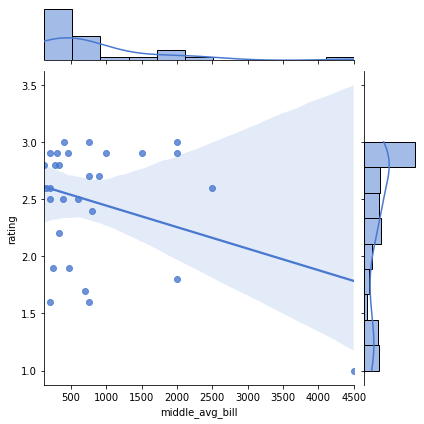

In [181]:
sns.jointplot(x='middle_avg_bill', y='rating', data=data.query('rating <= 3'), kind='reg')
plt.show()

Чем больше счет, тем ниже рейтинг. Но так как корреляция невысокая, очевидно, что это правило работает далеко не для всех заведений с низким рейтингом. По крайней мере в ЦАО, ВАО, ЮЗАО и ЮВАО цены у заведений с низкими рейтингами ниже, чем в среднем по району, однако они все равно получают плохие оценки. Поэтому цена немного влияет, но, судя по всему, влияет и еще что-то - возможно качество, антураж, особенности публики и пр.

А какие особенности у лучших заведений Москвы?

### Выявим особенности заведений с максимальными рейтингами

#### Изучим, какие категории у заведений с самыми высокими оценками встречаются чаще всего

Чтобы получить данные именно с такими заведениями, отфильтруем датафрейм так, чтобы оставались только заведения с рейтингом не ниже 4,5 (минимальный рейтинг для премии "*Хорошее место*" из Я.карт). При этом создадим совмещенные диаграммы, чтобы удобнее было смотреть различия для заведений с оценками от 4,5, но ниже 5 и для круглых "отличников".

In [182]:
# фильтруем данные для заведений с рейтингом не ниже 4,5, но ниже 5:
best_rate = (
    data
    .query('4.5 <= rating < 5')
    .groupby('category', as_index=False)
    .agg(count=('category', 'count'))
    .sort_values(by='count', ascending=False)
)

# данные для заведений с оценкой 5:
best_rate2 = (
    data
    .query('rating == 5')
    .groupby('category', as_index=False)
    .agg(count=('category', 'count'))
    .sort_values(by='count', ascending=False)
)

# для создания совмещенных графиков требуется импортировать make_subplots:
from plotly.subplots import make_subplots
# Создаем совмещенный график, прописывая, что на 1 строке у нас их 2.'domain' type прописываем, так как у нас Pie-диаграммы:
fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])

# Для каждого круга прописываем параметры и названия. У нас будут "бублики", поэтому для них проставляем hole:
fig.add_trace(go.Pie(labels=best_rate['category'], values=best_rate['count'], 
                     hole=0.6, pull=[0.1, 0], name='Рейтинг 4,5+'), 1, 1)
fig.add_trace(go.Pie(labels=best_rate2['category'], values=best_rate2['count'], 
                     hole=0.6, pull=[0.1, 0], name='Рейтинг 5'), 1, 2)
# Называем наш график:
fig.update_layout(
    title_text="Распределение категорий в заведениях с наивысшим рейтингом",
    # Добавляем подписи с параметрами в центр наших "бубликов", чтобы было ясно где какой:
    annotations=[dict(text='Рейтинг 4,5 и выше', x=0.13, y=0.5, font_size=14, showarrow=False),
                 dict(text='Рейтинг 5', x=0.84, y=0.5, font_size=14, showarrow=False)])

fig.show()

В "отличниках" абсолютное большинство ***кофеен***. На втором месте ***кафе***, а на третьем - ***рестораны***. У заведений с рейтингом от 4,5, но ниже 5 лидируют ***рестораны***, далее идут ***кафе***, тройку замыкают ***бары,пабы*** и ***кофейни***.

***Столовые***, ***булочные***, ***быстрое питание*** и ***пиццерии*** в обоих случаях здесь на последних местах, но не стоит забывать, что их в принципе в датафрейме меньше всего.

#### Посмотрим, как распределяются категории заведений по районам Москвы при рейтинге от 4,5, но ниже 5

In [183]:
# Фильтруем данные как в прошлый раз, но теперь группируем еще и по округу:
best_rate_dist = (
    data
    .query('4.5 <= rating < 5')
    .groupby(['district', 'category'], as_index=False)
    .agg(count=('category', 'count'))
)

# Строим столбачутую диаграмму, передавая ей название осей и параметры размера, ориентации, палитры, а также текст легенды и 
# подписей:
fig = px.bar(best_rate_dist, x='count', y='district', color='category', 
             title='Количество заведений каждой категории с рейтингом 4.5 и выше по районам', orientation = 'h',
            width=980, height=600, color_discrete_sequence=px.colors.qualitative.Set3)
fig.update_layout(yaxis={'categoryorder':'total ascending'}, xaxis_title="Количество заведений", 
                  yaxis_title="Район города", legend_title='Категория')
fig.show()

Очевидно, что в случае рейтинга "*выше 4,5, но ниже 5*" район имеет большое значение - в ЦАО сосредоточено почти 800 таких заведений, а в остальных районах их количество не достигает и 200, в СЗАО вообще не дотягивает и до 100.

В ЦАО видим, что большинство заведений - ***рестораны*** и ***бары, пабы***. В других районах первенство варьируется в основном между ***ресторанами*** и ***кафе***.

#### Посмотрим, как распределяются категории заведений по районам Москвы при рейтинге 5

In [184]:
# Фильтруем данные и группируем по нужным столбцам:
best_rate_dist2 = (
    data
    .query('rating == 5')
    .groupby(['district', 'category'], as_index=False)
    .agg(count=('category', 'count'))
)

# Строим столбачутую диаграмму, передавая ей название осей и параметры размера, ориентации, палитры, а также текст легенды и 
# подписей:
fig = px.bar(best_rate_dist2, x='count', y='district', color='category', 
             title='Количество заведений каждой категории, имещих рейтинг 5, по районам', orientation = 'h',
            width=980, height=600, color_discrete_sequence=px.colors.qualitative.Set3)
fig.update_layout(yaxis={'categoryorder':'total ascending'}, xaxis_title="Количество заведений", 
                  yaxis_title="Район города", legend_title='Категория')
fig.show()

В Северном административном округе оказалось больше всего заведений-"отличников". По категориям абсолютно лидерство в этом районе у ***кофеен***, второе место заняли ***кафе***.
ЦАО на втором месте по количеству "отличников". Здесь на первом месте уже ***кафе***, а ***кофейни*** только на втором. 
В остальных районах количество заведений с оценкой "5" варьируется от 5 до 11 шт. Чаще всего распределение то же - ***кофейни*** и ***кафе*** занимают то там, то там 1 и 2 место. Но встречаются исключения: например, в ЮАО чуть больше ***ресторанов***-отличников.

#### Изучим какие медианные цены у заведений с высшими оценками по разным категориям

Создадим совмещенный график для этой цели, но на этот раз столбчатый.

In [185]:
# фильтруем данные для 2-ух наборов заведений:
best_rate_price_cat = (
    data
    .query('4.5 <= rating < 5')
    .groupby('category', as_index=False)
    .agg(price=('middle_avg_bill', 'median'))
    .sort_values(by='price', ascending=False)
)

best_rate2_price_cat = (
    data
    .query('rating == 5')
    .groupby('category', as_index=False)
    .agg(price=('middle_avg_bill', 'median'))
    .sort_values(by='price', ascending=False)
)

# Создаем совмещенный график с 2-мя линейными графиками. Для каждого прописываем свое название: 
fig = make_subplots(rows=1, cols=2, shared_yaxes=True, 
                    subplot_titles=("Заведения с рейтингом 4,5 и выше", "Заведения с рейтингом 5"))

# прописываем параметры и название для каждого графика, каждому из них указываем использовать выбранную нами цветовую шкалу:
fig.add_trace(go.Bar(x=best_rate_price_cat['category'], y=best_rate_price_cat['price'], name='Рейтинг 4,5 и выше',
                     marker=dict(color=best_rate_price_cat['price'], coloraxis="coloraxis")), 1, 1)

fig.add_trace(go.Bar(x=best_rate2_price_cat['category'], y=best_rate2_price_cat['price'], name='Рейтинг 5',     
                    marker=dict(color=best_rate2_price_cat['price'], coloraxis="coloraxis")), 1, 2)

# Прописываем цветовую шкалу, название графика и оси у, скрываем ненужную тут легенду:
fig.update_layout(coloraxis=dict(colorscale='RdYlGn_r'), showlegend=False, yaxis_title_text="Медианные цены",
                  title_text="Средние цены в лучших заведениях Москвы по категориям")
fig.show()

Рассчитаем медианную цену по категориям по всем данным:

In [186]:
category_price = data.groupby('category')['middle_avg_bill'].agg('median')
category_price

category
бар,паб            1250.0
булочная            450.0
быстрое питание     375.0
кафе                550.0
кофейня             400.0
пиццерия            600.0
ресторан           1250.0
столовая            300.0
Name: middle_avg_bill, dtype: float64

При сравнении этих цифр с графиком оказывается, что почти по всем категориям (кроме ***столовых*** и ***баров, пабов***) медианная цена у заведений с оценкой 4,5+ выше, причем значительно, чем в среднем по всем заведениям такой категории.

При этом у заведений с рейтингом 5 цены почти по всем категориям, кроме ***пиццерии***, ниже. Но и у ***пиццерий*** превышение совсем не большое (+62 рубля)

Очевидно, что при равенстве категорий пользователи явно склонны ставить пятерки тем заведениям, где цены ниже.

#### Изучим медианные цены в заведениях с высокими рейтингами по округам

In [187]:
# фильтруем данные для 2-ух наборов заведений:
best_rate_price_dist = (
    data
    .query('4.5 <= rating < 5')
    .groupby('district', as_index=False)
    .agg(price=('middle_avg_bill', 'median'))
    .sort_values(by='district', ascending=False) # проставим сортировку по району - так проще по очереди сравнить
                                                 # один район с другим.
)

best_rate2_price_dist = (
    data
    .query('rating == 5')
    .groupby('district', as_index=False)
    .agg(price=('middle_avg_bill', 'median'))
    .sort_values(by='district', ascending=False)
)

# Создаем совмещенный график с 2-мя линейными графиками. Для каждого прописываем свое название: 
fig = make_subplots(rows=1, cols=2, shared_yaxes=True, 
                    subplot_titles=("Заведения с рейтингом 4,5 и выше", "Заведения с рейтингом 5"))

# прописываем параметры и название для каждого графика, каждому из них указываем использовать выбранную нами цветовую шкалу:
fig.add_trace(go.Bar(x=best_rate_price_dist['district'], y=best_rate_price_dist['price'], name='Рейтинг 4,5 и выше',
                     marker=dict(color=best_rate_price_dist['price'], coloraxis="coloraxis")), 1, 1)

fig.add_trace(go.Bar(x=best_rate2_price_dist['district'], y=best_rate2_price_dist['price'], name='Рейтинг 5',     
                    marker=dict(color=best_rate2_price_dist['price'], coloraxis="coloraxis")), 1, 2)
# Прописываем цветовую шкалу, название графика и оси у, скрываем ненужную тут легенду:
fig.update_layout(coloraxis=dict(colorscale='RdYlGn_r'), showlegend=False, yaxis_title_text="Медианные цены",
                  title_text="Средние цены в лучших заведениях Москвы")
fig.show()

Заведения в одном районе явно чаще получают пятерки, если их цены ниже.

Вызовем ранее рассчитаную нами табличку на все заведения с медианными ценами по районам:

In [188]:
district_price

district
Восточный административный округ            575.0
Западный административный округ            1000.0
Северный административный округ             650.0
Северо-Восточный административный округ     500.0
Северо-Западный административный округ      700.0
Центральный административный округ         1000.0
Юго-Восточный административный округ        450.0
Юго-Западный административный округ         600.0
Южный административный округ                500.0
Name: middle_avg_bill, dtype: float64

Видим, что в случае с оценками "*4,5, но ниже пяти*" у заведений выше цены, чем в среднем по району. Видимо, берут качеством или ещё чем-то. При этом в случае с "отличниками" цены могут быть как выше (например, в ВАО цены у отличников 850 при средней ценовой категории по району - 575), так и ниже (в ЗАО у "отличников" средний чек 375, тогда как по району это 1000). 

## Выводы по анализу датафрейма со всеми категориями заведений

###  Перед исследованием проект прошел следующую предобработку:
- Был изменен тип данных у столбца `chair`
- Выполнен поиск явных и неявных дубликатов с их устранением, где это было возможно;
- Замена пропусков не выполнялась, так как невозможно восполнить данные пропуски более-менее достоверными данными.

Информация в базе была собрана из открытых источников либо добавлена пользователями, логично предположить, что основная причина отсутствия данных - человеческий фактор. Часть данных:

1. **могла не быть известной пользователям** - Некоторые виды данных, такие как информация о часах работы (`hours`), цены (`price`), средний счет (`avg_bill`) и количество посадочных мест (`seats`) требуют визита в заведение. Если визита не было, а в интернете информация не была найдена, могли образоваться пустые строки;

2. **не заполнялась владельцами бизнеса по субъективным причинам**.

Как можно уменьшить количество пропусков в будущем?

Чтобы таких пропусков было меньше, следует принимать меры по поощрению пользователей и владельцев бизнеса к заполнению информации. Пользователям выдавать ачивки, например, а владельцам бизнеса давать небольшую, но приятную скидку на рекламу или приоритетное размещение при заполнении всего профиля заведения.

### Перед началом расчётов в датафрейм были помещены новые столбцы:

- Столбец `street` с названиями улиц из столбца с адресом;
- Столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
        -Где *True* — если заведение работает ежедневно и круглосуточно;
        -И *False* — в противоположном случае.

### В ходе работы над проектом было обнаружено следующее:

#### Распределение категорий заведений

В ходе анализа было установлено, что  наибольшую долю занимают: 
- ***Кафе*** -  28,3% заведений;
- ***Рестораны*** - доля 24.3%;
- ***Кофейни*** - 16.8%. 

Меньше 10% занимают заведения с типом "Бар, паб" (9,1%), "Пиццерия"(7,54%), "Быстрое питание"(7,18%), "Столовая"(3,75%) и "Булочная"(3,05%).

#### Посадочные места

В ресторанах встречается самое большое количество посадочных мест. Также, много посадочных мест у баров, пабов, кофеен и столовых. Все эти заведения имеют 75+ мест.
Категории быстрое питание, кафе и пиццерии имеют примерно 55-65 посадочных мест. Меньше всего мест (около 50) в булочных.

#### Принадлежность к сети

Несетевых заведений почти в 2 раза больше, чем сетевых.

#### Принадлежности к сети и категория заведения

НЕСЕТЕВЫЕ заведения в основном преобладают. Их в примерно 2-2,5 раза больше в категориях ***кафе***, ***ресторан***, ***бар,паб***, ***столовая***, ***быстрое питание***, чем сетевых.

В категориях ***булочная***, ***кофейня*** и ***пиццерия*** со сравнительно небольшим отрывом лидируют СЕТЕВЫЕ заведения.

Возможно, это связано с тем, что в категориях булочная, кофейня и пиццерия меню достаточно ограничено, с рецептурой и уникальными предложениями особо не разбежишься. Это может усложнять конкуренцию, так как трудно создать что-то уникальное и быть замеченным потребителем. В таком случае владельцы бизнеса могут посчитать, что проще выбрать проверенную франшизу и присоединится к её сети.

А вот кафе, рестораны, бары, столовые и заведения быстрого питания не ограничены ассортиментом, могут предлагать разные кухни с любыми вариациями, комбинировать их между собой, выделяясь среди конкурентов.

#### Топ-15 сетевых заведений по популярности

Самые крупные сетевые заведения это: 

- **Шоколадница** (120 заведений) - доля 14,6% среди топ-15;
- **Домино'с пицца** (76 заведений) - доля 9,22% среди топ-15;
- **Додо пицца** (74 заведения) - доля 8,98% среди топ-15;
- **Оne price coffee** (71) - доля 8,62% среди топ-15;
- **Яндекс лавка** (69) - доля 8,37% среди топ-15;
- **Cofix** (65) - доля 7,89% среди топ-15;
- **Prime** (50) - доля 6,07% среди топ-15;
- **Чайхана** (45) - доля 5,46% среди топ-15;
- **Хинкальная** (44) - доля 5,34% среди топ-15;
- **Кофепорт** (42) - доля 5,1% среди топ-15;
- **Кулинарная лавка Братьев Караваевых** (39) - доля 4,73% среди топ-15;
- **Теремок** (38) - доля 4,61% среди топ-15;
- **Буханка** (32) - доля 3,88% среди топ-15;
- **Cofefest** (32) - доля 3,88% среди топ-15;
- **Му-Му** (27) - доля 3,28% среди топ-15.

У каждого из этих брендов в Москве насчиталось не менее 25 заведений.

#### Категории сетевого топ-15

Лидируют ***кофейни***, далее идут ***рестораны*** и ***пиццерии***. Также много заведений у ***кафе***.

Заведения одной сети могут различаться по категориям. Это может быть связано как с ошибками при внесении информации в базу данных, так и с тем, что какие-то заведения сети могут иметь больший и более разнообразный ассортимент, какие-то - меньший, что и приводит к различию в категориях.

#### Распределение сетевого топ-15 по районам Москвы

Абсолютное большинство заведений из самых крупных сетей находится в ЦАО. Меньше всего их в СЗАО и ЮВАО.

Первая тройка категорий сетевых заведений в ЦАО, - кофейня, ресторан, кафе, - отличается почти от всей остальной Москвы. Везде, кроме ЦАО и ЮВАО, вместо кафе в топ-3 категорий входят пиццерии. Остальные категории представлены в районах единичными заведениями (буквально 1-2 организации). Немного выбиваются только булочные - в ЗАО, САО и СВАО наблюдается некоторое скопление заведений этой категории из топ-15 по популярности.

#### Общее количество заведений и их распределение по категориям

По количеству заведений и категорий лидер ЦАО. В центре сосредоточено более 2500 тыс. заведений датафрейма. Все другие районы имеют общее количество заведений меньше 1000. Такое расхождение по количеству может объясняться тем, что ЦАО - культурный и деловой центр Москвы, который привлекает бизнес большими потоками платежеспособных клиентов.

В САО, ЮАО, СВАО и ЗАО примерно одинаковое количество заведений - в пределах примерно 800-900. Далее, начиная с ВАО, количество заведений начинает снижаться, однако нигде не падает ниже 700, кроме СЗАО, где общее количество заведений не достигает даже 500. 

В плане категорий везде лидируют ***рестораны*** и ***кафе***. Также к первой тройке категорий можно отнести ***кофейни***. В ЦАО выделяется большое количество ***баров,пабов***, однако в других районах их намного меньше. Примечательно, что при такой насыщенности центра барами заведений этого типа из топ-15 по популярности в ЦАО совсем мало (всего 2, что видно на предыдущем графике). 

#### Средний рейтинг по категориям заведений

Средние рейтинги различаются не сильно - в зависимости от категории заведения варьируются от значений от 4 до 4,5. Самый высокий рейтинг получают ***бар,паб*** - 4,39. ***Пиццерия***, ***ресторан***, ***кофейня*** и ***булочная*** находятся на примерно одном уровне - рейтинг от 4.3 до 4,27. Ниже всего рейтинг у ***столовых*** (4,21), ***кафе*** (4,12) и ***быстрого питания*** (4,05).

Возможно, это связано с тем, что именно эти категории могут иметь большой разлет по качеству. Например, тем же *кафе* может быть как приличное заведение с интересным антуражем, так и нечто посредственное с едой сомнительного происхождения.

#### Средний рейтинг на карте Москвы

Хороплет показывает, что наибольший средний рейтинг имеют заведения в центре Москвы (ЦАО). Также довольно хорошие оценки получают заведения из САО и СЗАО. Самый низкий рейтинг имеют заведения в ЮВАО.

#### Концентрация заведений на карте Москвы

Хороплет с кластерами показывает нам, что большое количество заведений (около 3000) сконцентрировано в центре и вокруг него. Нигде больше в Москве такой концентрации не наблюдается. Остальные районы имеют сопоставимое количество заведений, но чем дальше от центра, тем концентрированность заведений ниже. Убыль особенно заметна в южных районах.

#### Ценовая категория района

По хороплету также можно увидеть, что самый дорогой по медиане - ЦАО. Но ему не уступает ЗАО, что неудивительно - именно здесь начинается Рублевское и Рублево-Успенское шоссе, ведущее к "Рублевке" - элитному району с правительственными и не только дачами и домами. Цены на недвижимость здесь одни из самых высоких в мире. Инфраструктура, включая заведения общепита, соответственно, здесь тоже может стоить недешево, даже если они будут очень далеко от центра.

Вторые по дороговизне СЗАО и САО. ВАО и ЮЗАО ненамного, но дешевле их. Самые бюджетные - ЮАО, ЮВАО и СВАО.

#### Топ-15 улиц по количеству заведений
Наибольшее количество заведений с большим отрывом находится на *проспекте Мира* - здесь почти 200 заведений. На 2 месте - *Профсоюзная ул.* (около 130 заведений), на 3-ем - *пр. Вернадского* (примерно 110), за которым с почти таким же, но немного меньшим количеством, следует *Ленинский проспект*. 

Самые "маленькие" улицы из топ-15 - *ул. Миклухо-Маклая* и *Пятницкая*. На каждой из них чуть меньше 50 заведений.

По категориям почти на каждой улице преобладают ***кафе*** и ***рестораны*** - то одной, то другой категории на каждой улице немного больше или немного меньше. Третья по распространенности категория - ***кофейни***. Сравнительно одинаково количество ***пиццерий*** и ***баров,пабов***. Меньше всего ***столовых*** и ***булочных***.

(!) Выделяется из общей картины *МКАД* - здесь абсолютное лидерство у кафе, а второй по размеру категорией являются не рестораны, а быстрое питание, при этом тут самое маленькое количество баров,пабов, а пиццерий и булочных (пожалуй, наиболее семейных и домашних категорий) вообще нет. Видимо, в дороге людям интересна еда попроще, побыстрее и без алкоголя.

#### Улицы с одним объектом общепита

На улицах с единственным заведением лидируют ***кафе*** (161 заведение). Далее следуют ***рестораны*** (93) и ***кофейни*** (84). Реже всего здесь можно встретить ***булочную*** (8 заведений) и ***пиццерию*** (15).

Подавляющее большинство улиц с единственным заведением располагаются в ЦАО (145). Далее распределение в целом равномерно - от 55 до 35 улиц с единственным заведением можно встретить в СВАО, САО, ВАО, ЮАО, ЮВАО и ЗАО. Очень мало таких улиц только в СЗАО (20) и ЮЗАО (18). Однако эти данные неудивительны и в целом согласуются с пунктом 1.3.6, где мы могли видеть, что в СЗАО и ЮЗАО в принципе меньше всего заведений, а значит ожидаемо, что у них будут более низкие количественные показатели в ряде параметров.

По рейтингам заметна тенденция к пусть небольшому, но всё же увеличению оценки практически во всех категориях по сравнению с пунктом, где мы считали средний рейтинг для всех категорий датафрейма. То есть, *если заведение единственное на улице, то люди скорее склонны ставить ему более высокие оценки*. Возможно потому, что рядом нет конкурентов для критического сравнения.

#### Особенности заведений с плохими рейтингами

**Распространенность по районам**

Больше всего заведений с низкими оценками в ЮВАО - здесь 50 заведений имеют рейтинг ниже тройки (21,4% от всех заведений с плохим рейтингом). На втором месте СВАО - 38. Тройку замыкает ЗАО - здесь 35 заведений имеют рейтинг ниже тройки.

В то же время в ЦАО, где находится подавляющее большинство заведений датасета, очень мало заведений с плохим рейтингом - всего 7. На почти 2500 заведений всего 7 рейтингом ниже или равным 3 говорит о том, что либо аура центра повышает рейтинги, либо в центре могут выжить только достаточно хорошие заведения.

В СЗАО, к слову, тоже мало заведений с плохим рейтингом, однако у этого района меньше всего заведений в датасете. Больше впечатляют САО и ЮАО - они на втором и третьем месте по суммарному количеству заведений и при этом среди их мест общепита мало тех, что с низким рейтингом.

**Категории заведений с плохими рейтингами**

Если пользователи и ставят низкие оценки, то лояльнее относятся к заведениям ***пиццерий***, ***кофеен***, ***быстрого питания*** - средний рейтинг у них от 2,51 до 2,36. ***Булочным*** и ***барам,пабам*** чаще ставят оценки хуже - их плохой рейтинг не дотягивает даже до двойки.

**Плохие оценки по районам**

В ВАО и ЦАО ставят плохие оценки повыше - здесь средняя оценка заведения с плохим рейтингом 2,57 и 2,56 соответственно. Похуже оценки в САО - тут средний рейтинг 2,49. В ЮАО, ЗАО, ЮВАО, СЗАО и СВАО рейтинги у заведений с худшими оценками варьируются от 2,31 до 2.22. А вот заведения в ЮЗАО сильно минусят - 2,03 средняя оценка заведения с низким рейтингом.

**Средний чек по районам**

Цены в таких заведениях порой выше, чем в среднем по району. Например, мы вычислили, что медиана цены для СЗАО по всему датафрейму - 700. Здесь она почти в 1,5 раза больше - 1100. В САО средняя цена - 650, здесь же она 900. По крайней мере эти заведения могут получать свои низкие оценки из-за чрезмерной дороговизны.

Это предположение подтверждается слабой отрицательной корреляцией Пирсона (0,338). Но так как она невысокая, очевидно, что это правило работает далеко не для всех заведений с низким рейтингом. По крайней мере в ЦАО, ВАО, ЮЗАО и ЮВАО цены у заведений с низкими рейтингами ниже, чем в среднем по району, однако они все равно получают плохие оценки. Поэтому цена немного влияет на рейтинг, но, судя по всему, влияет и еще что-то - возможно качество, антураж, особенности публики и пр.

#### Заведения с максимальным рейтингом

**Категории заведений с максимальным рейтингом**

Больше всего пятерок собирают кофейни (35,2%) от всех заведений с пятерками и кафе (28,6). У заведений с оценкой 4,5 и выше, но ниже 5 лидируют ***рестораны***, далее идут ***кафе***, тройку замыкают ***бары,пабы*** и ***кофейни***.

***Столовые***, ***булочные***, ***быстрое питание*** и ***пиццерии*** в обоих случаях здесь на последних местах, но не стоит забывать, что их в датафрейме меньше всего.

В целом же видим, что ***кофейни*** и ***кафе*** чаще других получают более высокие оценки. ***Рестораны*** тоже показывают неплохой результат, но им реже ставят 5-ки.

**Районы  заведений с лучшим рейтингом**

В случае рейтинга "выше 4,5, но ниже 5" район имеет большое значение - в ЦАО сосредоточено почти 800 таких заведений, а в остальных районах их количество не достигает и 200, в СЗАО вообще не дотягивает и до 100.

В ЦАО видим, что большинство заведений с высокими оценками - рестораны и бары, пабы. В других районах первенство варьируется в основном между ресторанами и кафе.

В случае рейтинга 5 лидерство переходит к САО. По категориям абсолютно лидерство в этом районе у ***кофеен***, второе место заняли ***кафе***.

ЦАО на втором месте по количеству "отличников" - возможно публика тут более придирчивая, чем в САО и её стандартам сложнее соответствовать в каждом отдельном случае, а может район создает завышенные ожидания. Здесь на первом месте уже ***кафе***, а ***кофейни*** только на втором.

В остальных районах количество заведений с оценкой "5" варьируется от 5 до 11 шт. Чаще всего распределение то же - ***кофейни*** и ***кафе*** занимают то там, то там 1 и 2 место. Но встречаются исключения: например, в ЮАО чуть больше ***ресторанов***-отличников.

**Цены при рейтинге "4,5, но ниже 5" и рейтинге "5" по категориям и округам**

Медианная цена у заведений с оценкой 4,5+ и выше, причем значительно, чем в среднем по всем заведениям такой категории.

У заведений с рейтингом 5 цены почти по всем категориям, кроме ***пиццерии***, ниже.
То есть, при равенстве категорий пользователи явно склонны ставить пятерки тем заведениям, где цены ниже.

В случае с округами при оценке "*4,5, но ниже пяти*" у заведений выше цены, чем в среднем по району, а в случае с отличниками напротив цены почти во всех округах (кроме ЮЗАО и ВАО) ниже.

#### Цель исследования достигнута

Можно выделить следующие рекомендации, которые помогут с выбором места, типа заведения и ценовой политикой:

- **Наиболее высокая конкуренция** ожидается, если открыть ***кафе***, ***ресторан*** или ***кофейню***, так как больше всего заведений в Москве имеют именно такую категорию. **Меньше всего конкуренция** должна быть, если открывать ***булочную*** или ***столовую*** - таких заведений выявлено меньше всего.

- **Больше всего заведений общественного питания сосредоточено в ЦАО**. Если открываться здесь, особенно в категории кофейни, ресторана, бара или кафе, то конкуренция будет максимальная. С другой стороны исследование показывает, что заведения в ЦАО, которые имеют позитивные отзывы от пользователей и высокий рейтинг (от 4,5) могут позволить себе ставить цены выше, чем в среднем по району. **Меньше всего конкуренция должна быть в ЮВАО, ЮЗАО и СЗАО** - здесь меньше всего заведений. Если открываться тут, то нужно учитывать, что в СЗАО цены могут быть в среднем выше, чем по городу (медиана заказа в СЗАО - 700 рублей), но ниже, чем в ЦАО или ЗАО (1000). ЮЗАО (медиана 600) и особенно ЮВАО (медиана 450) требуют цен пониже. 

- **В ЮВАО** достаточно много заведений с низким рейтингом (3 и ниже). Это может указывать как на то, что люди тут более придирчивы, так и на то, что району не хватает хороших мест - **открытие качественного заведения может быть конкурентным преимуществом**.

- Лояльнее всего посетители относятся к ***пиццериям***, ***кофейням***, ***быстрому питанию*** - их плохие оценки не такие уж и плохие. Сильнее всего минусят и придираются к ***булочным*** и ***барам,пабам***.

- ***Кофейни*** и ***кафе*** чаще других получают более высокие оценки. ***Рестораны*** тоже показывают неплохой результат, но им реже ставят 5-ки.

- Медианная цена у заведений с оценкой "*4,5, но ниже пяти*" выше, причем значительно, чем в среднем по всем заведениям такой категории. У заведений с рейтингом 5 цены почти по всем категориям, кроме пиццерии, ниже. То есть, **при равенстве категорий пользователи склонны ставить пятерки тем заведениям, где цены ниже**.

## Исследование рынка кофеен города Москвы

Заказчикам исследования, - основателям фонда «Shut Up and Take My Money», - не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли их мечта и параметры, которые могут повлиять на успешность будущей кофейни.

### Рассчитаем сколько всего кофеен и как они распределются по районам Москвы

In [189]:
# фильтруем данные по принадлежности к кофейне, делаем группировку и считаем:
coffee = (
    data
    .query('category == "кофейня"')
    .groupby('district', as_index=False)
    .agg(count=('category', 'count'))
)

# выведем на табличку число кофеен:
total_coffee = data.query('category == "кофейня"')['name'].agg('count')
text_an = f'Всего кофеен: {total_coffee}'

# Строим столбачутую диаграмму, передавая ей название осей и параметры размера, ориентации, палитры, а также текст легенды и 
# подписей:
fig = px.bar(coffee, x='district', y='count', text="count",
             title='Кофейни и их распределение по районам Москвы', orientation = 'v',
            width=980, height=600, color_discrete_sequence=px.colors.qualitative.Set3)
fig.update_layout(xaxis={'categoryorder':'total descending'}, xaxis_title="Округ Москвы", 
                  yaxis_title="Количество")

# Прописываем расположение вывода информации о количестве кофеен:
fig.add_annotation(x=7.5, y=400,
            text=text_an,
            showarrow=False,
            yshift=10)
fig.show()

Видим, что подавляющее большинство кофеен сосредоточено в ЦАО - 428 из 1413 в датасете. Также, много их в САО (193) и СВАО (159). 
Меньше всего кофеен (количество не достигает 100) в ЮЗАО (96), ЮВАО (89) и СЗАО (62).

Построим хороплет с кластерами, чтобы посмотреть как удаленность от центра влияет на концентрацию кофеен.

In [190]:
# создадим новую карту:
coffee_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту:
Choropleth(
    geo_data=state_geo,
    data=coffee,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    legend_name='Концентрация кофеен на карте Москвы',
).add_to(coffee_map)

# создаём пустой кластер, добавляем его на карту
cluster_coffee = MarkerCluster().add_to(coffee_map)

# пишем функцию, которая принимает строку датафрейма, создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def coffee_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}",
    ).add_to(cluster_coffee)

# применяем функцию create_clusters() к каждой строке датафрейма
data.query('category == "кофейня"').apply(coffee_clusters, axis=1)

# выводим карту
coffee_map

По карте видно, что:
- В ЦАО количество кофеен максимально, но есть более-менее незанятые участки. На границах ЦАО и:
    - ВАО
    - ЮВАО;
    - САО.
    
  Концентрация кофеен поменьше - тут конкуренция может быть не такой сильной. 
  

- По мере удаления от центра кофеен все меньше и меньше. В некоторых отдаленных районах их нет вообще (а значит потенциально мало конкурентов). Это Капотня, Бутово, район парка Кузьминки, Солнцево и Ново-Переделкино, Митино, Куркино, Рублево-Архангельское, Некрасовка, Косино-Ухтомский.

### Выясним, где находятся кофейни, единственные на своей улице

In [191]:
# используем ранее созданную нами сводку данных для анализа улиц с одним заведением. фильтруем данные по принадлежности к 
# кофейне, делаем группировку и считаем:
coffee_dist_one_st = (
    unique_filtered_streets
    .query('category == "кофейня"')
    .groupby(['district'], as_index=False)
    .agg(count=('district', 'count'))
)

# Строим столбачутую диаграмму, передавая ей название осей и параметры размера, ориентации, палитры, а также текст легенды и 
# подписей:
fig = px.bar(coffee_dist_one_st, x='district', y='count', color='district', text='count',
             title='Распределение кофеен, единственных на своей улице, по округам Москвы', labels={
                     "district": "Округ Москвы",
                     "count": "Количество",
                     "count": "Количество"
                 },orientation = 'v', width=950, height=600, color_discrete_sequence=px.colors.qualitative.Set3)

# определяем порядок вывода столбцов:
fig.update_layout(xaxis={'categoryorder':'total descending'})

# выводим количество заведений на столбцы:
fig.update_traces(textposition='outside')
fig.show()

Видим, что больше всего кофеен-одиночек в ЦАО (34), САО (13) и СВАО (10). Меньше всего их в СЗАО и ЗАО - всего 2 и 3 соответственно.

### Изучим, распределение кофеен на топ-15 улиц по округам Москвы

In [192]:
# используем ранее созданную нами сводку данных для анализа топ-15 улиц. Фильтруем данные по принадлежности к кофейне, делаем 
# группировку и считаем:
coffee_dist_top_st = (
    streets_filtered
    .query('category == "кофейня"')
    .groupby('district', as_index=False)
    .agg(count=('district', 'count')).round(2)
)

# Строим столбачутую диаграмму, передавая ей название осей и параметры размера, ориентации, палитры, а также текст легенды и 
# подписей:
fig = px.bar(coffee_dist_top_st, x='district', y='count', color='district', text="count",
             title='Распределение кофеен на топ-15 улиц по округам Москвы', labels={
                     "district": "Округ Москвы",
                     "count": "Количество",
                     "count": "Количество"
                 },orientation = 'v', width=950, height=600, color_discrete_sequence=px.colors.qualitative.Set3)

# определяем порядок вывода столбцов:
fig.update_layout(xaxis={'categoryorder':'total descending'})
# выводим количество заведений на столбцы:
fig.update_traces(textposition='outside')
fig.show()

Кофейни часто располагаются на улицах из топ-15 в ЮЗАО (46) и САО (45). И почти совсем нет их на таких улицах в ВАО и СЗАО - всего по 1 кофейне.

### Круглосуточные кофейни

Проведем анализ круглосуточных кофеен по нескольким параметрам: расположению, сеть/не сеть, сравнение цен с некруглосуточными кофейнями.

#### Распределение круглосуточных кофеен по округам

In [193]:
# Выделяем круглосуточные заведения:
data_clock = data.loc[data['is_24/7'] == True]

# Фильтруем данные с круглосуточными заведениями по принадлежности к кофейне, делаем группировку и считаем:
around_clock = (
    data_clock
    .query('category == "кофейня"')
    .groupby('district', as_index=False)
    .agg(count=('district', 'count'))
)

# выведем на табличку число кофеен:
around_clock_total = around_clock['count'].agg('sum')
text_an = f'Всего круглосуточных кофеен в датасете: {around_clock_total}'


# Строим столбачутую диаграмму, передавая ей название осей и параметры размера, ориентации, палитры, а также текст легенды и 
# подписей:
fig = px.bar(around_clock, x='district', y='count', color='district', text="count",
             title='Круглосуточные кофейни и их распределение по районам Москвы', labels={
                     "district": "Округ Москвы",
                     "count": "Количество",
                     "count": "Количество"
                 }, orientation = 'v',
            width=980, height=600, color_discrete_sequence=px.colors.qualitative.Set3)

fig.update_layout(xaxis={'categoryorder':'total descending'}, xaxis_title="Округ Москвы", 
                  yaxis_title="Количество")
fig.add_annotation(x=6, y=35,
            text=text_an,
            showarrow=False,
            yshift=10)
fig.update_traces(textposition='outside')

fig.show()

Большинство круглосуточных кофеен находится в ЦАО (26 из 59). В остальных районах их меньше 10. В ЮВАО и ЮАО вообще по одной.

##### Исследуем, кто чаще открывает круглосуточные кофейни - сетевые заведения или НЕсетевые

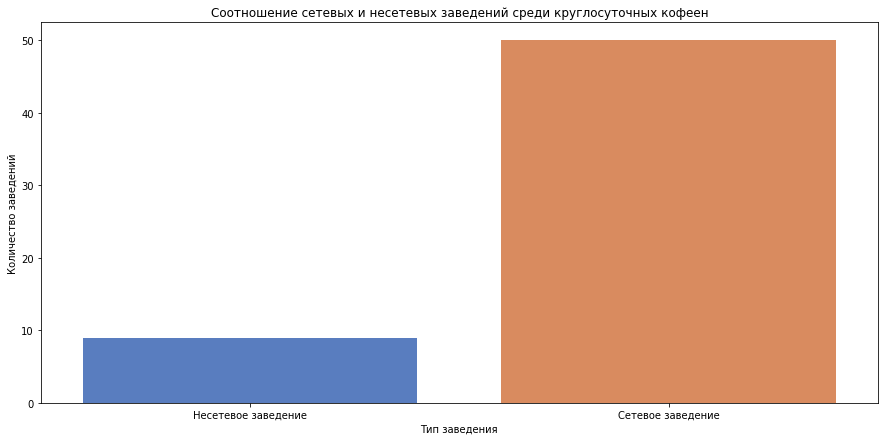

In [194]:
# Фильтруем данные с круглосуточными заведениями по принадлежности к кофейне и сетям, делаем группировку и считаем:
around_clock_chain = (
    data_clock
    .query('category == "кофейня"')
    .groupby('chain')
    .agg(count=('chain', 'count'))
    .rename(index={0: 'Несетевое заведение', 1: 'Сетевое заведение'})
    .reset_index()
)

# Строим график
plt.figure(figsize=(15, 7))
ax = sns.barplot(x='chain', y='count', data=around_clock_chain)
ax.set(xlabel='Тип заведения', ylabel='Количество заведений', 
       title="Cоотношение сетевых и несетевых заведений среди круглосуточных кофеен")
plt.show()

Видим, что подавляющее большинство круглосуточных заведений - сетевые. Возможно, такие условия франшизы.

#### Изучим цены в кофейнях с разным режимом работы по районам

In [195]:
# фильтруем данные для 2-ух наборов заведений:
around_clock_price = (
    data_clock
    .query('category == "кофейня"')
    .groupby('district', as_index=False)
    .agg(price=('middle_coffee_cup', 'median'))
    .sort_values(by='district', ascending=False)
)

# для некруглосуточных кофеен создадим отдельную табличку с некруглосуточными заведениями:
no_around_clock = data.loc[data['is_24/7'] == False]

no_around_clock_price = (
    no_around_clock
    .query('category == "кофейня"')
    .groupby('district', as_index=False)
    .agg(price=('middle_coffee_cup', 'median'))
    .sort_values(by='district', ascending=False)
)

# Создаем совмещенный график с 2-мя линейными графиками. Для каждого прописываем свое название: 
fig = make_subplots(rows=1, cols=2, shared_yaxes=True, 
                    subplot_titles=("Круглосуточные кофейни", "НЕ круглосуточные кофейни"))

# прописываем параметры и название для каждого графика, каждому из них указываем использовать выбранную нами цветовую шкалу:
fig.add_trace(go.Bar(x=around_clock_price['district'], y=around_clock_price['price'], name='Круглосуточные кофейни',
                     marker=dict(color=around_clock_price['price'], coloraxis="coloraxis")), 1, 1)

fig.add_trace(go.Bar(x=no_around_clock_price['district'], y=no_around_clock_price['price'], name='НЕ круглосуточные кофейни',     
                    marker=dict(color=no_around_clock_price['price'], coloraxis="coloraxis")), 1, 2)

# Прописываем цветовую шкалу, название графика и оси у, скрываем ненужную тут легенду:
fig.update_layout(coloraxis=dict(colorscale='RdYlGn_r'), showlegend=False, yaxis_title_text="Медианные цены",
                  title_text="Цены в кофейнях с разным режимом работы")
fig.show()

Видим, что круглосуточные кофейни склонны устанавливать цены выше, чем некруглосуточные. Это объяснимо - работа ночью это тоже затраты, которые кофейня должна окупать. Но по ВАО видно, что и тут есть исключения.

#### Рейтинг кофеен по районам

In [196]:
# фильтруем и группируем данные:
coffee_rate_district = (
    data
    .query('category == "кофейня"')
    .groupby('district', as_index=False)
    .agg(mean_rate=('rating', 'mean')).round(2)
)

# создадим новую карту:
coffee_map_rate = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту:
Choropleth(
    geo_data=state_geo,
    data=coffee_rate_district,
    columns=['district', 'mean_rate'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.7,
    legend_name='Рейтинг кофеен по районам Москвы',
).add_to(coffee_map_rate)

# выводим карту
coffee_map_rate

Видим, что лучшие рейтинги у нас имеют ЦАО и СЗАО. Неплохие средние оценки также у кофеен в САО, ВАО и ЮЗАО. Пониже оценки у ЮВАО и ЮАО, но они всё равно лучше, чем у аутсайдеров - СВАО и особенно ЗАО.

#### Рейтинг кофеен, которые находятся на улицах с единственным заведением и на топ-улицах

Помимо районного расположения, неплохо будет узнать, стоит ли искать улицы с какими-то определенными параметрами. Для этого сравним попарно рейтинги кофеен на улицах с большим количеством заведений и рейтинги кофеен, где только одно заведение.

In [197]:
# фильтруем данные для 2-ух наборов заведений (улицы с единственным заведением и топ-улицы):
coffee_rate_one_st = (
    unique_filtered_streets
    .query('category == "кофейня"')
    .groupby('district', as_index=False)
    .agg(mean_rate=('rating', 'mean')).round(2)
    .sort_values(by='district', ascending=False)
)

coffee_rate_top_st = (
    streets_filtered
    .query('category == "кофейня"')
    .groupby('district', as_index=False)
    .agg(mean_rate=('rating', 'mean')).round(2)
    .sort_values(by='district', ascending=False)
)

# Создаем совмещенный график с 2-мя линейными графиками. Для каждого прописываем свое название: 
fig = make_subplots(rows=1, cols=2, shared_yaxes=False, 
                    subplot_titles=('Средний рейтинг кофейни-"одиночки"',"Средний рейтинг кофейни на топ-улице"))

# прописываем параметры и название для каждого графика, каждому из них указываем использовать выбранную нами цветовую шкалу:
fig.add_trace(go.Bar(x=coffee_rate_one_st['district'], y=coffee_rate_one_st['mean_rate'], name='Кофейня-"одиночка"',
                     marker=dict(color=coffee_rate_one_st['mean_rate'], coloraxis="coloraxis")), 1, 1)

fig.add_trace(go.Bar(x=coffee_rate_top_st['district'], y=coffee_rate_top_st['mean_rate'], name='Кофейня на топ-улице',     
                    marker=dict(color=coffee_rate_top_st['mean_rate'], coloraxis="coloraxis")), 1, 2)

# Прописываем цветовую шкалу, название графика и оси у, скрываем ненужную тут легенду:
fig.update_layout(coloraxis=dict(colorscale='ylgn'), showlegend=False, yaxis_title_text="Рейтинг",
                  title_text="Средний рейтинг кофеен по округам Москвы на улицах с единственным заведением и на топ-улицах")
fig.show()

Единой закономерности нет - каждый отдельный случай лучше анализировать по району. По некоторым районам кофейни примерно равны по оценкам, но в ЮВАО выделяется рейтинг "одиночки" 4,45 против 3,9 на топ-улице (правда в ЮВАО это единственная кофейня на топ-улице, поэтому однозначный вовыд здесь сложно сделать). В СВАО показатели не так различаются, но тоже заметны (4,25 у "одиночки" против 4,02 на топ-улице).

#### Рейтинг кофеен в зависимости от принадлежности к сети

In [198]:
# фильтруем данные для 2-ух наборов заведений (чтобы в них оставались только сетевые и несетевые кофейни):
coffee_rate_chain_yes = (
    data
    .query('category == "кофейня" and chain == 1')
    .groupby('district', as_index=False)
    .agg(mean_rate=('rating', 'mean')).round(2)
    .sort_values(by='district', ascending=False)
)

coffee_rate_chain_no = (
    data
    .query('category == "кофейня" and chain == 0')
    .groupby('district', as_index=False)
    .agg(mean_rate=('rating', 'mean')).round(2)
    .sort_values(by='district', ascending=False)
)

# Создаем совмещенный график с 2-мя линейными графиками. Для каждого прописываем свое название: 
fig = make_subplots(rows=1, cols=2, shared_yaxes=False, 
                    subplot_titles=("Средний рейтинг сетевой кофейни","Средний рейтинг НЕсетевой кофейни"))

# прописываем параметры и название для каждого графика, каждому из них указываем использовать выбранную нами цветовую шкалу:
fig.add_trace(go.Bar(x=coffee_rate_chain_yes['district'], y=coffee_rate_chain_yes['mean_rate'], name='Сетевая кофейня',
                     marker=dict(color=coffee_rate_chain_yes['mean_rate'], coloraxis="coloraxis")), 1, 1)

fig.add_trace(go.Bar(x=coffee_rate_chain_no['district'], y=coffee_rate_chain_no['mean_rate'], name='НЕсетевая кофейня',     
                    marker=dict(color=coffee_rate_chain_no['mean_rate'], coloraxis="coloraxis")), 1, 2)

# Прописываем цветовую шкалу, название графика и оси у, скрываем ненужную тут легенду:
fig.update_layout(coloraxis=dict(colorscale='ylgn'), showlegend=False, yaxis_title_text="Рейтинг",
                  title_text="Средний рейтинг кофеен по округам Москвы в зависимости от принадлежности к сети")

fig.show()

В целом, заметно, что посетители склонны более высоко оценивать несетевые кофейни.

В плане района заметно, что особенно ценят несетевые кофейни в СЗАО (4,49 против 4,19 в пользу несетевых кофеен) и ЮВАО (4,32 против 4,03 в пользу несетевых кофеен).

### Выясним, на какую стоимость чашки капучино стоит ориентироваться

В первую очередь будет неплохо узнать какие вообще есть цены на чашку капучино в среднем по районам.

#### Медианная цена за чашку капучино по округам Москвы

In [199]:
# Готовим данные для карты:
coffee_price_district = (
    data
    .query('category == "кофейня"')
    .groupby('district', as_index=False)
    .agg(price=('middle_coffee_cup', 'median'))
)

# создадим новую карту:
coffee_price = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту:
Choropleth(
    geo_data=state_geo,
    data=coffee_price_district,
    columns=['district', 'price'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    legend_name='Цены на чашку капучино по районам Москвы',
).add_to(coffee_price)

# выводим карту
coffee_price

Видим, что в ЦАО, ЗАО и ЮЗАО попить капучино стоит дороже всего - примерно 180-200 рублей/чашка. Немного дешевле север Москвы - СЗАО, САО и СВАО имеют среднюю цену в районе 155-170 рублей за чашку капучино. Еще либеральнее по ценам юг, а именно ЮАО и ЮВАО - здесь в среднем попросят 145-155 рублей/чашка. Наконец, наиболее демократичен ВАО - здесь капучино в среднем обойдется в 135-145 рублей.

#### Цена чашки капучино по округам Москвы на улицах с единственным заведением и на топ-улицах

Изучим как наличие и отсутствие конкурентов влияет на ценовую политику заведений.

In [200]:
# фильтруем данные для 2-ух наборов заведений (улицы с единственным заведением и топ-улицы):
coffee_price_one_st = (
    unique_filtered_streets
    .query('category == "кофейня"')
    .groupby('district', as_index=False)
    .agg(price=('middle_coffee_cup', 'median'))
    .sort_values(by='district', ascending=False)
)

coffee_price_top_st = (
    streets_filtered
    .query('category == "кофейня"')
    .groupby('district', as_index=False)
    .agg(price=('middle_coffee_cup', 'median'))
    .sort_values(by='district', ascending=False)
)

# Создаем совмещенный график с 2-мя линейными графиками. Для каждого прописываем свое название: 
fig = make_subplots(rows=1, cols=2, shared_yaxes=True, 
                    subplot_titles=('Цены в кофейне-"одиночке"',"Цены в кофейне на топ-улице"))

# прописываем параметры и название для каждого графика, каждому из них указываем использовать выбранную нами цветовую шкалу:
fig.add_trace(go.Bar(x=coffee_price_one_st['district'], y=coffee_price_one_st['price'], name='Кофейня-"одиночка"',
                     marker=dict(color=coffee_price_one_st['price'], coloraxis="coloraxis")), 1, 1)

fig.add_trace(go.Bar(x=coffee_price_top_st['district'], y=coffee_price_top_st['price'], name='Кофейня на топ-улице',     
                    marker=dict(color=coffee_price_top_st['price'], coloraxis="coloraxis")), 1, 2)

# Прописываем цветовую шкалу, название графика и оси у, скрываем ненужную тут легенду:
fig.update_layout(coloraxis=dict(colorscale='RdYlGn_r'), showlegend=False, yaxis_title_text="Медианная цена",
                  title_text="Цена чашки капучино по округам Москвы на улицах с единственным заведением и на топ-улицах")
fig.show()

Не хватает данных по округам из-за отсутствия их в датафрейме, но определенные особенности все равно видны. В частности заметно, что в одинаковом районе дешевле купить капучино там, где кофейня - единственное заведение на улице. Это может быть связано с более низкой стоимостью аренды помещения на такой улице, а также тем, что без большого числа конкурентов рядом клиентов проще привлекать, а значит можно продавать больше, устанавливая более демократичные цены.

#### Изучим, как принадлежность к сети влияет на ценообразование

In [201]:
# фильтруем данные для 2-ух наборов заведений (сетевых и несетевых):
coffee_price_chain_yes = (
    data
    .query('category == "кофейня" and chain == 1')
    .groupby('district', as_index=False)
    .agg(price=('middle_coffee_cup', 'median'))
    .sort_values(by='district', ascending=False)
)

coffee_price_chain_no = (
    data
    .query('category == "кофейня" and chain == 0')
    .groupby('district', as_index=False)
    .agg(price=('middle_coffee_cup', 'median'))
    .sort_values(by='district', ascending=False)
)

# Создаем совмещенный график с 2-мя линейными графиками. Для каждого прописываем свое название: 
fig = make_subplots(rows=1, cols=2, shared_yaxes=True, 
                    subplot_titles=("Цена в сетевой кофейне","Цена в НЕсетевой кофейне"))

# Прописываем параметры и название для каждого графика, каждому из них указываем использовать выбранную нами цветовую шкалу:
fig.add_trace(go.Bar(x=coffee_price_chain_yes['district'], y=coffee_price_chain_yes['price'], name='Сетевая кофейня',
                     marker=dict(color=coffee_price_chain_yes['price'], coloraxis="coloraxis")), 1, 1)

fig.add_trace(go.Bar(x=coffee_price_chain_no['district'], y=coffee_price_chain_no['price'], name='НЕсетевая кофейня',     
                    marker=dict(color=coffee_price_chain_no['price'], coloraxis="coloraxis")), 1, 2)

# Прописываем цветовую шкалу, название графика и оси у, скрываем ненужную тут легенду:
fig.update_layout(coloraxis=dict(colorscale='ylgn'), showlegend=False, yaxis_title_text="Медианная цена",
                  title_text="Сравнение цен на чашку капучино по сетевым и несетевым заведениям")

fig.show()

Явной взаимосвязи между ценами и принадлежностью к сетям нет. Видим, что как в сетевой кофейне может быть низкая цена относительно несетевой (109,5 против 170 в ЮВАО), так и наоборот - сетевая может запросить большие цены (видно по ЗАО, где сетевая кофейня просит в среднем 222,5 рублей, тогда как несетевая - 170).

##### Средние цены на кофе в лучших кофейнях по оценкам пользователей

Чтобы открыть "крутую кофейню", полезно будет посмотреть на уровень цен уже открытых крутых кофеен (по крайней мере, по оценкам пользователей). Для этого возьмем кофейни с оценками "*4,5 и выше, но ниже 5*" и "*5*" и проанализируем какие цены они установили у себя.

In [202]:
# Фильтруем датафрейм так, чтобы в нем остались только кофейни с рейтингом 4,5+ и 5:
best_coffee_price = (
    data
    .query('category == "кофейня" and 4.5 <= rating < 5')
    .groupby('district', as_index=False)
    .agg(price=('middle_coffee_cup', 'median'))
    .sort_values(by='district', ascending=False)
)

best_coffee_price2 = (
    data
    .query('category == "кофейня" and rating == 5')
    .groupby('district', as_index=False)
    .agg(price=('middle_coffee_cup', 'median'))
    .sort_values(by='district', ascending=False)
)

# Создаем совмещенный график с 2-мя линейными графиками. Для каждого прописываем свое название: 
fig = make_subplots(rows=1, cols=2, shared_yaxes=True, 
                    subplot_titles=("Заведения с рейтингом 4,5 и выше", "Заведения с рейтингом 5"))

# прописываем параметры и название для каждого графика, каждому из них указываем использовать выбранную нами цветовую шкалу:
fig.add_trace(go.Bar(x=best_coffee_price['district'], y=best_coffee_price['price'], name='Рейтинг 4,5 и выше',
                     marker=dict(color=best_coffee_price['price'], coloraxis="coloraxis")), 1, 1)

fig.add_trace(go.Bar(x=best_coffee_price2['district'], y=best_coffee_price2['price'], name='Рейтинг 5',     
                    marker=dict(color=best_coffee_price2['price'], coloraxis="coloraxis")), 1, 2)

# Прописываем цветовую шкалу, название графика и оси у, скрываем ненужную тут легенду:
fig.update_layout(coloraxis=dict(colorscale='RdYlGn_r'), showlegend=False, yaxis_title_text="Медианные цены",
                  title_text="Средний чек в кофейнях с наивысшим рейтингом по районам Москвы")
fig.show()

Видим, что, опять же, 5 чаще получают те заведения, где цена на чашку капучино ниже. Но это справедливо не для всех округов - в САО у заведений с оценкой "5" медианная цена 182,5 против 159 у заведений этого же района, но с более низким рейтингом. У ВАО такая же история.

### Выясним количество посадочных мест, чаще всего встречающееся в лучших заведениях

Эта информация для открытия кофейни будет не лишней. На этот раз не будем делить анализ лучших заведений на 2 категории, поскольку выборка из-за среза и так получится достаточно ограниченная. Вместо этого рассчитаем медиану мест для всех заведений, чей рейтинг 4,5 и выше.

In [203]:
# Фильтруем датафрейм так:
best_coffee_seats = (
    data
    .query('category == "кофейня" and 4.5 <= rating and seats != 999999')
    .groupby('district', as_index=False)
    .agg(seats=('seats', 'median'))
)

# Строим столбачутую диаграмму, передавая ей название осей и параметры размера, ориентации, палитры, а также текст легенды и 
# подписей:
fig = px.bar(best_coffee_seats, x='district', y='seats', color='district', text="seats",
             title='Посадочные места в лучших заведениях Москвы по округам', orientation = 'v',
             labels={
                     "district": "Округ Москвы",
                 }, width=980, height=600, color_discrete_sequence=px.colors.qualitative.Set3)
fig.update_layout(xaxis={'categoryorder':'total descending'}, xaxis_title="Округ Москвы", 
                  yaxis_title="Посадочные места")
fig.update_traces(textposition='outside')

fig.show()

У кофеен с хорошими отзывами количество посадочных мест весьма варьируется:
- в ЮАО распространены крупные кофейни - они в среднем имеют 144 посадочных места;
- САО, ЮЗАО и ЦАО находятся примерно на одном уровне - в среднем здесь можно наблюдать 83-95 посадочных мест;
- ЗАО, ВАО, ЮВАО и СВАО имеют на порядок меньше вместимость - от 36 до 60 посадочных мест;
- Совсем маленькие кофейни в СЗАО - здесь в среднем 10 посадочных мест.

## Выводы по исследованию об окрытии кофейни

### Представленность кофеен в Москве

**Общая доля кофеен** от всех заведений в датафрейме составляет **16,8% или 1413 заведения из 8400**.

Больше всего кофеен можно встретить в ЦАО - 428. Также, их много в САО (193) и СВАО (159). Меньше всего кофеен (количество не достигает 100) в ЮЗАО (96), ЮВАО (89) и СЗАО (62).

### Районы с наименьшим количеством конкурентов
По хороплету с кластерами можно видеть, что несмотря на большое количество кофеен, в округах Москвы есть достаточно свободные районы на любой вкус:
- В **ВАО** это Метрогородок, Косино-Ухтомский,  Некрасовка, Ивановское;
- В **ЮВАО** район парка Кузьминки, Капотня, Жулебино, Рязанский. Незанятый перспективный участок у ЦАО - Лефортово;
- В **ЮАО** мало кофеен в Бирюлево Западном, рядом с музеем-заповедником "Коломенское", ближе к ЦАО - граница Даниловского района и Замоскворечья;
- В **ЮЗАО** - нет кофее в районах Бутово;
- В **ЗАО** - свободны Солнцево, Толстопальцево, Ново-Переделкино, Рублево-Архангельское, ближе к ЦАО - участок рядом с Новоарбатским мостом;
- В **СЗАО** можно обратить внимание на Митино, Куркино, Северное Тушино (рядом с лесопарком);
- В **САО** - Молжаниновский и Западное Дегунино;
- В **СВАО** относительно не заняты Марфино, юг Ростокино и Лосиноостровский районы

В **ЦАО** на первый взгляд всё забито, но выделяется свободный участок на *Рубцовской набережной*, район Горбатого моста, *Котельническая набережная*, *Большая Андроньевская улица*.

### Преимущества расположения на улице без конкурентов и улице с большим количеством других заведений

В ЦАО находится больше всего кофеен, которые единственные на своей улице. В ЮЗАО и САО наоборот много кофеен, которые находятся на улицах, где больше всего других заведений. Явных плюсов для рейтинга от такого расположения нет. Но зато есть разница в ценах - на улицах без конкурентов, похоже, легче привлекать посетителей - цены в таких местах почти всегда ниже, чем на топ-улицах.

### Особенности круглосуточных кофеен
Подавляющее большинство круглосуточных кофеен сосредоточено в ЦАО (26 из 59 таких кофеен). В остальных районах их меньше 10. В ЮВАО и ЮАО вообще по одной. Такая сосредоточенность в ЦАО объяснима - центр Москвы никогда по-настоящему не спит. Посетители найдутся в любое время суток.

Круглосуточные кофейни чаще всего открывают сети. Возможно, это политика франшиз. 

Цены в кофейнях с круглосуточной работой почти всегда выше, чем в среднем по району - вероятно связано с тем, что содержание кофейни необходимо окупать, а также с относительной монополией в ночное время.

### Факторы, от которых зависят оценки пользователей

**Районная принадлежность**

Наиболее высокие оценки от пользователей получают кофейни ЦАО и СЗАО. Неплохие средние оценки также у кофеен в САО, ВАО и ЮЗАО. Пониже оценки у ЮВАО и ЮАО, но они всё равно лучше, чем у СВАО и особенно ЗАО - кофейни в этих районах пользователи оценивают ниже всего.

**Принадлежность к сети**

Кофейни, не относящиеся ни к какой сети пользователи склонны оценивать выше, чем сетевые. Причин такого поведения может быть много: НЕсетевые заведения чаще демонстрируют индивидуальность, уникальный ассортимент, более гибкую ценовую политику. Что-то из этого, а может сразу всё, может стимулировать клиентов ставить оценки выше.

По районам заметно, что особенно ценят несетевые кофейни в СЗАО (4,49 против 4,19 в пользу несетевых кофеен) и ЮВАО (4,32 против 4,03 в пользу несетевых кофеен).

### Ориентир на цену для чашки капучино

- Для кофейни в ЦАО, ЗАО и ЮЗАО нормальная средняя цена 180-200 рублей за чашку;
- Немного дешевле СЗАО, САО и СВАО - они имеют среднюю цену в районе 155-170 рублей за чашку;
-  В ЮАО и ЮВАО - в среднем попросят 145-155 рублей за чашку;
-  В ВАО обычно самый недорогой капучино - средняя стоимость в районе 135-145 рублей.

Следует учитывать, что пользователи склонны ставить пятерки заведениям с ценами немного ниже, чем в среднем по району или хотя бы на на нижней границе диапазона средней цены. При высоких ценах (выше средней цены или на верхней границе диапазона медианы по району) рейтинг тоже может быть хорошим (от 4,5), но до 5 рискует не дотянуть.

Если будет стоять задача сделать кофейню с доступными ценами, то лучше выбирать улицы без конкурентов - судя по всему, кофейни на таких улицах могут позволить себе устанавливать более низкие цены. Круглосуточная работа может сделать более дорогим содержание кофейни, а значит поднимет и её цены.

### Выбор помещения 

В датасете кофейни, имеющие лучшие оценки, имеют примерно такие помещения по разным районам:

- в ЮАО распространены крупные кофейни - они в среднем имеют 144 посадочных места;
- САО, ЮЗАО и ЦАО находятся примерно на одном уровне - в среднем здесь можно наблюдать 83-95 посадочных мест;
- ЗАО, ВАО, ЮВАО и СВАО имеют на порядок меньше вместимость - от 36 до 60 посадочных мест;
- Совсем маленькие кофейни в СЗАО - здесь в среднем 10 посадочных мест.